<a href="https://colab.research.google.com/github/springboardmentor447/AI_STYLIST_Infosys_Internship_Oct2024/blob/vaithees/recommendation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import json
import re

# File path for your LDJSON file (change this to the actual path)
file_path = 'fashion_products_data.ldjson'

# Initialize an empty list to store parsed data
data_list = []

# Read the LDJSON file line by line and load data into a list
with open(file_path, 'r', encoding='utf-8') as file:
    for line in file:
        # Parse each line as a JSON object
        data = json.loads(line)
        data_list.append(data)

# Convert the list of dictionaries into a pandas DataFrame
df = pd.DataFrame(data_list)

# Show the first few rows of the DataFrame to inspect
print("First few rows of the DataFrame:")
print(df.head())

# Basic Info: Check DataFrame structure
print("\nDataFrame Info:")
print(df.info())

# Checking for missing values in each column
print("\nMissing values per column:")
print(df.isnull().sum())

# Handle missing values (Optional step: filling NaN with a default value for specific columns)
df.fillna({'product_name': 'Unknown', 'rating': 0.0, 'sales_price': 0.0}, inplace=True)

# Convert numerical columns to appropriate data types (if required)
df['sales_price'] = pd.to_numeric(df['sales_price'], errors='coerce')
df['rating'] = pd.to_numeric(df['rating'], errors='coerce')

# Handle any remaining NaN values after conversion (if they are still NaN)
df['sales_price'].fillna(0.0, inplace=True)
df['rating'].fillna(0.0, inplace=True)

# Extract 'sales_rank_in_parent_category' column and parse it into a numeric value
if 'sales_rank_in_parent_category' in df.columns:
    df['sales_rank_parent_category'] = df['sales_rank_in_parent_category'].apply(
        lambda x: int(re.search(r'\d+', str(x)).group()) if isinstance(x, str) else None
    )

# Example of creating new features or filtering data
# Filter products with a rating above 4.0 and sales price below 300
filtered_df = df[(df['rating'] > 4.0) & (df['sales_price'] < 300)]

# Show filtered data
print("\nFiltered Data (rating > 4.0 and sales_price < 300):")
print(filtered_df.head())

# Save the cleaned and filtered DataFrame to a new CSV file
filtered_df.to_csv('filtered_fashion_products.csv', index=False)

print("\nFiltered data saved to 'filtered_fashion_products.csv'")

First few rows of the DataFrame:
                            uniq_id            crawl_timestamp        asin  \
0  26d41bdc1495de290bc8e6062d927729  2020-02-07 05:11:36 +0000  B07STS2W9T   
1  410c62298852e68f34c35560f2311e5a  2020-02-07 08:45:56 +0000  B07N6TD2WL   
2  52e31bb31680b0ec73de0d781a23cc0a  2020-02-06 11:09:38 +0000  B07WJ6WPN1   
3  25798d6dc43239c118452d1bee0fb088  2020-02-07 08:32:45 +0000  B07PYSF4WZ   
4  ad8a5a196d515ef09dfdaf082bdc37c4  2020-02-06 14:27:48 +0000  B082KXNM7X   

                                         product_url  \
0  https://www.amazon.in/Facon-Kalamkari-Handbloc...   
1  https://www.amazon.in/Sf-Jeans-Pantaloons-T-Sh...   
2  https://www.amazon.in/LOVISTA-Traditional-Prin...   
3  https://www.amazon.in/People-Printed-Regular-T...   
4  https://www.amazon.in/Monte-Carlo-Cotton-Colla...   

                                        product_name  \
0  LA' Facon Cotton Kalamkari Handblock Saree Blo...   
1  Sf Jeans By Pantaloons Men's Plain Slim fit T-

<ipython-input-4-d9e67d9622f4>:41: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['sales_price'].fillna(0.0, inplace=True)
<ipython-input-4-d9e67d9622f4>:42: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df


Filtered data saved to 'filtered_fashion_products.csv'


In [ ]:
print(brand)

pradeep fashion


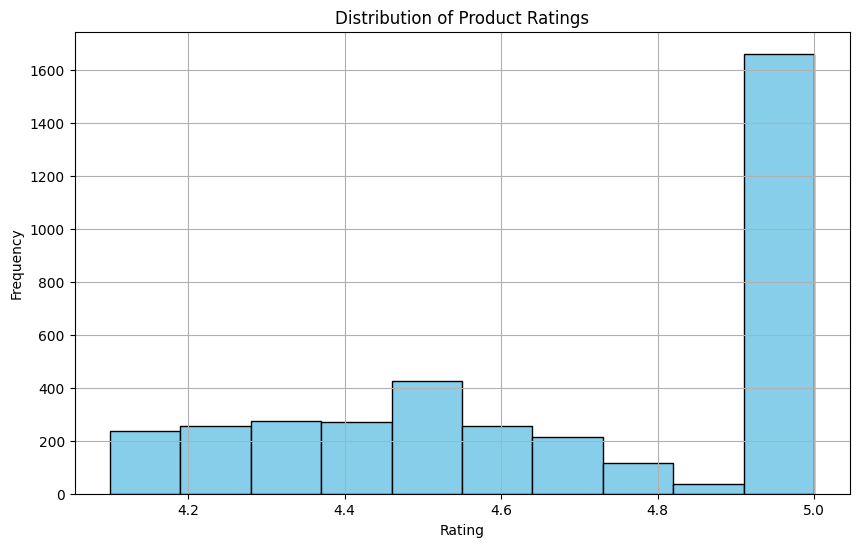

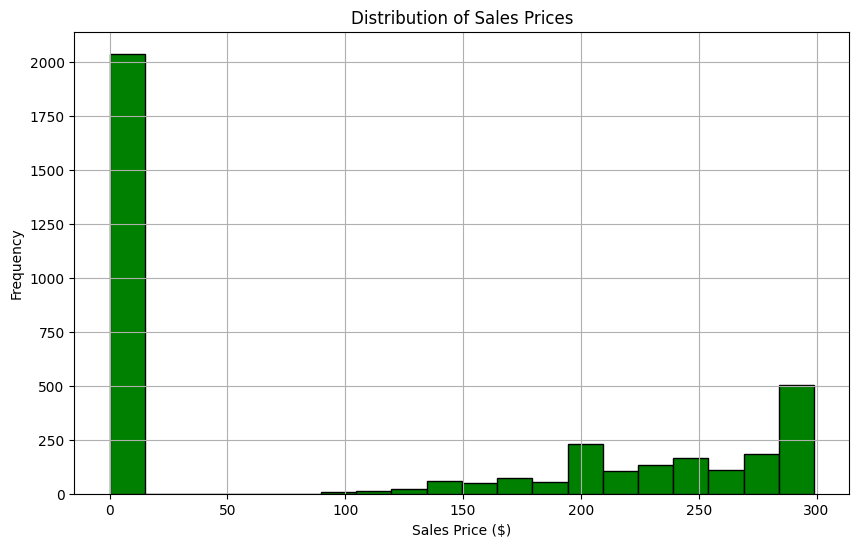

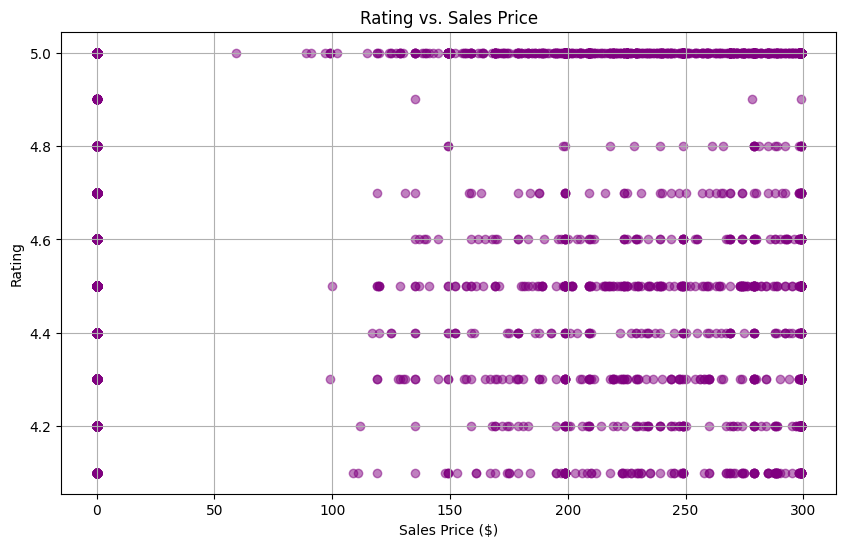

In [ ]:
import matplotlib.pyplot as plt

# Load the cleaned and filtered data from the CSV
filtered_df = pd.read_csv('filtered_fashion_products.csv')

# Plotting the distribution of product ratings
plt.figure(figsize=(10, 6))
plt.hist(filtered_df['rating'], bins=10, color='skyblue', edgecolor='black')
plt.title('Distribution of Product Ratings')
plt.xlabel('Rating')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# Plotting the distribution of sales prices
plt.figure(figsize=(10, 6))
plt.hist(filtered_df['sales_price'], bins=20, color='green', edgecolor='black')
plt.title('Distribution of Sales Prices')
plt.xlabel('Sales Price ($)')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# Scatter plot of rating vs. sales price
plt.figure(figsize=(10, 6))
plt.scatter(filtered_df['sales_price'], filtered_df['rating'], alpha=0.5, color='purple')
plt.title('Rating vs. Sales Price')
plt.xlabel('Sales Price ($)')
plt.ylabel('Rating')
plt.grid(True)
plt.show()

In [ ]:
pip install nltk


In [ ]:
import nltk

In [ ]:
!pip install langdetect


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.5/981.5 kB 10.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for langdetect: filename=langdetect-1.0.9-py3-none-any.whl size=993222 sha256=8233065fbbbc633acdf25112bcc5d31afbf86921ca180c1aa26f5eb00049c990
  Stored in directory: /root/.cache/pip/wheels/95/03/7d/59ea870c70ce4e5a370638b5462a7711ab78fba2f655d05106
Successfully built langdetect


In [ ]:
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


True

In [ ]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
import pandas as pd
import json
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
import nltk

# Download required NLTK resources (run only once)
nltk.download('punkt')

# Initialize the stemmer
ps = PorterStemmer()

# File path for your LDJSON file
file_path = 'fashion_products_data.ldjson'

# Load essential fields into a DataFrame
data_list = []
with open(file_path, 'r', encoding='utf-8') as file:
    for line in file:
        data = json.loads(line)
        essential_data = {key: data.get(key) for key in ['product_url', 'product_name', 'sales_price', 'rating', 'metakeywords', 'medium', 'brand']}
        data_list.append(essential_data)

df = pd.DataFrame(data_list)

# Fill missing values
df.fillna({'product_name': 'Unknown', 'sales_price': 0.0, 'rating': 0.0}, inplace=True)

# Convert to numeric data types
df['sales_price'] = pd.to_numeric(df['sales_price'], errors='coerce').fillna(0.0)
df['rating'] = pd.to_numeric(df['rating'], errors='coerce').fillna(0.0)

# Apply stemming to 'product_name'
def stem_text(text):
    tokens = word_tokenize(text)
    return ' '.join(ps.stem(word) for word in tokens)

df['product_name_stemmed'] = df['product_name'].apply(stem_text)

# Display transformed DataFrame
print(df[['product_url', 'product_name_stemmed', 'sales_price', 'rating', 'metakeywords', 'medium', 'brand']])


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


                                             product_url  \
0      https://www.amazon.in/Facon-Kalamkari-Handbloc...   
1      https://www.amazon.in/Sf-Jeans-Pantaloons-T-Sh...   
2      https://www.amazon.in/LOVISTA-Traditional-Prin...   
3      https://www.amazon.in/People-Printed-Regular-T...   
4      https://www.amazon.in/Monte-Carlo-Cotton-Colla...   
...                                                  ...   
29995  https://www.amazon.in/Indian-Virasat-Pushp-Cha...   
29996  https://www.amazon.in/Urban-Ranger-Pantaloons-...   
29997  https://www.amazon.in/Peter-England-Striped-Re...   
29998  https://www.amazon.in/PINKY-PARI-Womens-Embroi...   
29999  https://www.amazon.in/Gutsy-Triple-Striped-Sle...   

                                    product_name_stemmed  sales_price  rating  \
0      la ' facon cotton kalamkari handblock sare blo...        200.0     5.0   
1      sf jean by pantaloon men 's plain slim fit t-s...        265.0     3.6   
2      lovista cotton gota patti tas

In [ ]:
import pandas as pd
import json
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
import nltk

# Download required NLTK resources (run only once)
nltk.download('punkt')

# Initialize the stemmer
ps = PorterStemmer()

# File path for your LDJSON file (change this to the actual path)
file_path = 'fashion_products_data.ldjson'

# Load only essential features from the LDJSON file into a DataFrame
data_list = []
with open(file_path, 'r', encoding='utf-8') as file:
    for line in file:
        data = json.loads(line)
        # Extract only the essential fields
        filtered_data = {key: data.get(key, None) for key in ['product_url', 'product_name', 'sales_price', 'rating', 'metakeywords', 'medium', 'brand']}
        data_list.append(filtered_data)

df = pd.DataFrame(data_list)

# Handle missing values
df.fillna({'product_name': 'Unknown', 'rating': 0.0, 'sales_price': 0.0}, inplace=True)

# Convert 'sales_price' and 'rating' to numeric types
df['sales_price'] = pd.to_numeric(df['sales_price'], errors='coerce').fillna(0.0)
df['rating'] = pd.to_numeric(df['rating'], errors='coerce').fillna(0.0)

# Stemming process for 'product_name' column
def stem_text(text):
    tokens = word_tokenize(text)
    stemmed = [ps.stem(word) for word in tokens]
    return ' '.join(stemmed)

df['product_name_stemmed'] = df['product_name'].apply(stem_text)

# Display DataFrame with essential columns and stemming applied
print(df[['product_url', 'product_name', 'product_name_stemmed', 'sales_price', 'rating', 'metakeywords', 'medium', 'brand']])


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


                                             product_url  \
0      https://www.amazon.in/Facon-Kalamkari-Handbloc...   
1      https://www.amazon.in/Sf-Jeans-Pantaloons-T-Sh...   
2      https://www.amazon.in/LOVISTA-Traditional-Prin...   
3      https://www.amazon.in/People-Printed-Regular-T...   
4      https://www.amazon.in/Monte-Carlo-Cotton-Colla...   
...                                                  ...   
29995  https://www.amazon.in/Indian-Virasat-Pushp-Cha...   
29996  https://www.amazon.in/Urban-Ranger-Pantaloons-...   
29997  https://www.amazon.in/Peter-England-Striped-Re...   
29998  https://www.amazon.in/PINKY-PARI-Womens-Embroi...   
29999  https://www.amazon.in/Gutsy-Triple-Striped-Sle...   

                                            product_name  \
0      LA' Facon Cotton Kalamkari Handblock Saree Blo...   
1      Sf Jeans By Pantaloons Men's Plain Slim fit T-...   
2      LOVISTA Cotton Gota Patti Tassel Traditional P...   
3               People Men's Printed Re

In [ ]:
import pandas as pd
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
import nltk

# Download NLTK resources (run only once)
nltk.download('wordnet')
nltk.download('punkt')

# Initialize the lemmatizer
lemmatizer = WordNetLemmatizer()

# Load the CSV file into a DataFrame
filtered_df = pd.read_csv('filtered_fashion_products.csv')

# Define the lemmatization function
def lemmatize_text(text):
    tokens = word_tokenize(text)
    lemmatized = [lemmatizer.lemmatize(word) for word in tokens]
    return ' '.join(lemmatized)

# Apply lemmatization to the 'product_name' column
filtered_df['product_name_lemmatized'] = filtered_df['product_name'].apply(lemmatize_text)

# Display the DataFrame with the lemmatized column
print(filtered_df[[ 'product_name_lemmatized']])


[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


                                product_name_lemmatized
0     LA ' Facon Cotton Kalamkari Handblock Saree Bl...
1     Carahere Boys Handmade Pre-Tied Classic Polka ...
2     Toddler Little Boy Straight Outta Timeout Long...
3                      Colt by Unlimited Men 's T-Shirt
4                 Pari Singh Orange Plain Women 's Frok
...                                                 ...
3747              Orange and Orchid Cotton a-line Dress
3748                     Max Boy 's Regular fit T-Shirt
3749  Disney X Zilingo Girls Frozen Printed Sleevele...
3750  Steps of doe Women 's Cotton Kurti ( 1_Multico...
3751  Flexfit Premium Original Wooly Combed Twill Yo...

[3752 rows x 1 columns]


In [ ]:
import pandas as pd
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
import nltk

# Download NLTK resources (run only once)
nltk.download('punkt')

# Initialize the stemmer
ps = PorterStemmer()

# Load the CSV file into a DataFrame
filtered_df = pd.read_csv('filtered_fashion_products.csv')

# Define the stemming function
def stem_text(text):
    tokens = word_tokenize(text)
    stemmed = [ps.stem(word) for word in tokens]
    return ' '.join(stemmed)

# Apply stemming to the 'product_name' column
filtered_df['product_name_stemmed'] = filtered_df['product_name'].apply(stem_text)

# Display the DataFrame with the stemmed column
print(filtered_df[[ 'product_name_stemmed']])


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


                                   product_name_stemmed
0     la ' facon cotton kalamkari handblock sare blo...
1     caraher boy handmad pre-ti classic polka dot b...
2     toddler littl boy straight outta timeout long ...
3                        colt by unlimit men 's t-shirt
4                  pari singh orang plain women 's frok
...                                                 ...
3747                orang and orchid cotton a-lin dress
3748                     max boy 's regular fit t-shirt
3749  disney x zilingo girl frozen print sleeveless ...
3750  step of doe women 's cotton kurti ( 1_multicol...
3751  flexfit premium origin wooli comb twill youth ...

[3752 rows x 1 columns]


In [ ]:
import pandas as pd
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
import nltk

# Download NLTK resources (run only once)
nltk.download('punkt')

# Initialize the stemmer
ps = PorterStemmer()

# Abbreviation dictionary (expand as needed)
abbreviations = {
    "t-shirt": "tee shirt",
    "blazer": "coat",
    "sneak": "sneaker",
    # Add more abbreviations as needed
}

# Load the CSV file into a DataFrame
filtered_df = pd.read_csv('filtered_fashion_products.csv')

# Function to expand abbreviations and apply stemming
def expand_and_stem(text):
    tokens = word_tokenize(text)
    expanded_tokens = [abbreviations.get(word.lower(), word) for word in tokens]
    stemmed = [ps.stem(word) for word in expanded_tokens]
    return ' '.join(stemmed)

# Apply abbreviation expansion and stemming to the 'product_name' column
filtered_df['product_name_processed'] = filtered_df['product_name'].apply(expand_and_stem)

# Display the DataFrame with the processed column
print(filtered_df[[ 'product_name_processed']])


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


                                 product_name_processed
0     la ' facon cotton kalamkari handblock sare blo...
1     caraher boy handmad pre-ti classic polka dot b...
2     toddler littl boy straight outta timeout long ...
3                      colt by unlimit men 's tee shirt
4                  pari singh orang plain women 's frok
...                                                 ...
3747                orang and orchid cotton a-lin dress
3748                   max boy 's regular fit tee shirt
3749  disney x zilingo girl frozen print sleeveless ...
3750  step of doe women 's cotton kurti ( 1_multicol...
3751  flexfit premium origin wooli comb twill youth ...

[3752 rows x 1 columns]


In [ ]:
pip install scikit-learn


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

# Example data
corpus = [
    "This is the first document.",
    "This document is the second document.",
    "And this is the third one.",
    "Is this the first document?"
]

# Create a CountVectorizer instance
vectorizer = CountVectorizer()

# Fit and transform the corpus
X = vectorizer.fit_transform(corpus)

# Convert to a dense array and display feature names
print("Feature Names:", vectorizer.get_feature_names_out())
print("Document-Term Matrix:\n", X.toarray())


Feature Names: ['and' 'document' 'first' 'is' 'one' 'second' 'the' 'third' 'this']
Document-Term Matrix:
 [[0 1 1 1 0 0 1 0 1]
 [0 2 0 1 0 1 1 0 1]
 [1 0 0 1 1 0 1 1 1]
 [0 1 1 1 0 0 1 0 1]]


In [ ]:
pip install pandas scikit-learn


In [ ]:
print(data.columns)


In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

# File path to your LDJSON file
file_path = 'fashion_products_data.ldjson'

# Step 1: Load the LDJSON file into a Pandas DataFrame
data = pd.read_json(file_path, lines=True)

# Debug: Print column names to identify the text field
print("Available columns:", data.columns)

# Step 2: Select the text field you want to process (Update field name if necessary)
text_field = 'description'  # Replace 'description' with the correct field name
if text_field in data.columns:
    text_data = data[text_field].fillna('')  # Handle missing values with empty strings
else:
    raise ValueError(f"Field '{text_field}' not found in the dataset!")

# Step 3: Create a Bag-of-Words representation
vectorizer = CountVectorizer(stop_words='english', max_features=1000)  # Customize as needed
bag_of_words = vectorizer.fit_transform(text_data)

# Step 4: Convert the matrix to a DataFrame for inspection
bow_df = pd.DataFrame(bag_of_words.toarray(), columns=vectorizer.get_feature_names_out())

# Inspect the result
print(bow_df.head())

# Save to CSV if needed
bow_df.to_csv('bag_of_words_output.csv', index=False)


Available columns: Index(['uniq_id', 'crawl_timestamp', 'asin', 'product_url', 'product_name',
       'image_urls__small', 'medium', 'large', 'browsenode', 'brand',
       'sales_price', 'weight', 'rating', 'sales_rank_in_parent_category',
       'sales_rank_in_child_category', 'delivery_type', 'meta_keywords',
       'amazon_prime__y_or_n', 'parent___child_category__all',
       'best_seller_tag__y_or_n', 'other_items_customers_buy',
       'product_details__k_v_pairs', 'discount_percentage', 'colour',
       'no__of_reviews', 'seller_name', 'seller_id', 'left_in_stock',
       'no__of_offers', 'no__of_sellers', 'technical_details__k_v_pairs',
       'formats___editions', 'name_of_author_for_books'],
      dtype='object')


ValueError: Field 'description' not found in the dataset!

In [ ]:
if field_2 not in data.columns:
    print(f"Field '{field_2}' not found. Skipping Bag-of-Words for this field.")
    bow_matrix_2 = None  # Optionally, handle as needed


Field 'description' not found. Skipping Bag-of-Words for this field.


In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
import numpy as np

# File path to your LDJSON file
file_path = 'fashion_products_data.ldjson'

# Step 1: Load the LDJSON file into a Pandas DataFrame
data = pd.read_json(file_path, lines=True)

# Step 2: Select fields for Bag-of-Words processing
field_1 = 'product_name'  # Update this to the correct field name
field_2 = 'description'  # Replace with an available field name

# Check available fields
print("Available columns:", data.columns)

# Fill missing values with empty strings for field_1
if field_1 in data.columns:
    data[field_1] = data[field_1].fillna('')
else:
    raise ValueError(f"Field '{field_1}' not found in the dataset!")

# Fill missing values with empty strings for field_2 (if it exists)
if field_2 in data.columns:
    data[field_2] = data[field_2].fillna('')
    process_field_2 = True
else:
    print(f"Field '{field_2}' not found. Skipping Bag-of-Words for this field.")
    process_field_2 = False

# Step 3: Create Bag-of-Words for field_1
vectorizer_1 = CountVectorizer(stop_words='english', max_features=1000)
bow_matrix_1 = vectorizer_1.fit_transform(data[field_1])

# Convert to dense matrix for inspection
dense_matrix_1 = bow_matrix_1.toarray()
df_matrix_1 = pd.DataFrame(dense_matrix_1, columns=vectorizer_1.get_feature_names_out())

# Save to CSV
df_matrix_1.to_csv('product_name_bow_matrix.csv', index=False)

# Step 4: Process field_2 if available
if process_field_2:
    vectorizer_2 = CountVectorizer(stop_words='english', max_features=1000)
    bow_matrix_2 = vectorizer_2.fit_transform(data[field_2])

    # Convert to dense matrix for inspection
    dense_matrix_2 = bow_matrix_2.toarray()
    df_matrix_2 = pd.DataFrame(dense_matrix_2, columns=vectorizer_2.get_feature_names_out())

    # Save to CSV
    df_matrix_2.to_csv('description_bow_matrix.csv', index=False)

print("Processing complete. Matrices saved as CSV files.")


Available columns: Index(['uniq_id', 'crawl_timestamp', 'asin', 'product_url', 'product_name',
       'image_urls__small', 'medium', 'large', 'browsenode', 'brand',
       'sales_price', 'weight', 'rating', 'sales_rank_in_parent_category',
       'sales_rank_in_child_category', 'delivery_type', 'meta_keywords',
       'amazon_prime__y_or_n', 'parent___child_category__all',
       'best_seller_tag__y_or_n', 'other_items_customers_buy',
       'product_details__k_v_pairs', 'discount_percentage', 'colour',
       'no__of_reviews', 'seller_name', 'seller_id', 'left_in_stock',
       'no__of_offers', 'no__of_sellers', 'technical_details__k_v_pairs',
       'formats___editions', 'name_of_author_for_books'],
      dtype='object')
Field 'description' not found. Skipping Bag-of-Words for this field.
Processing complete. Matrices saved as CSV files.


In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

# File path to your LDJSON file
file_path = 'fashion_products_data.ldjson'

# Step 1: Load the LDJSON file into a Pandas DataFrame
data = pd.read_json(file_path, lines=True)

# Step 2: Select fields for Bag-of-Words processing
field_1 = 'product_name'  # Ensure this is the correct field name
field_2 = 'description'   # Replace with an available field name



# Ensure 'asin' exists in the dataset
if 'asin' not in data.columns:
    raise ValueError("Field 'asin' not found in the dataset!")

# Fill missing values with empty strings for field_1
if field_1 in data.columns:
    data[field_1] = data[field_1].fillna('')
else:
    raise ValueError(f"Field '{field_1}' not found in the dataset!")

# Fill missing values with empty strings for field_2 (if it exists)
if field_2 in data.columns:
    data[field_2] = data[field_2].fillna('')
    process_field_2 = True
else:
    print(f"Field '{field_2}' not found. Skipping Bag-of-Words for this field.")
    process_field_2 = False

# Step 3: Create Bag-of-Words for field_1
vectorizer_1 = CountVectorizer(stop_words='english', max_features=1000)
bow_matrix_1 = vectorizer_1.fit_transform(data[field_1])

# Convert to dense matrix for inspection
dense_matrix_1 = bow_matrix_1.toarray()
df_matrix_1 = pd.DataFrame(dense_matrix_1, columns=vectorizer_1.get_feature_names_out())

# Add 'asin' to the matrix DataFrame
df_matrix_1.insert(0, 'asin', data['asin'])

# Save to CSV
df_matrix_1.to_csv('product_name_bow_matrix_with_asin.csv', index=False)

# Print sample rows with 'asin'
print("\nBag-of-Words matrix for 'product_name' with ASINs:")
print(df_matrix_1.head())

# Step 4: Process field_2 if available
if process_field_2:
    vectorizer_2 = CountVectorizer(stop_words='english', max_features=1000)
    bow_matrix_2 = vectorizer_2.fit_transform(data[field_2])

    # Convert to dense matrix for inspection
    dense_matrix_2 = bow_matrix_2.toarray()
    df_matrix_2 = pd.DataFrame(dense_matrix_2, columns=vectorizer_2.get_feature_names_out())

    # Add 'asin' to the matrix DataFrame
    df_matrix_2.insert(0, 'asin', data['asin'])

    # Save to CSV
    df_matrix_2.to_csv('description_bow_matrix_with_asin.csv', index=False)

    # Print sample rows with 'asin'
    print("\nBag-of-Words matrix for 'description' with ASINs:")
    print(df_matrix_2.head())

print("\nProcessing complete. Matrices with ASINs saved as CSV files.")


Field 'description' not found. Skipping Bag-of-Words for this field.

Bag-of-Words matrix for 'product_name' with ASINs:
         asin  10  100  10xl  11  12  13  14  15  18  ...  yellow  yoga  york  \
0  B07STS2W9T   0    1     0   0   0   0   0   0   0  ...       0     0     0   
1  B07N6TD2WL   0    0     0   0   0   0   0   0   0  ...       0     0     0   
2  B07WJ6WPN1   0    0     0   0   0   0   0   0   0  ...       0     0     0   
3  B07PYSF4WZ   0    0     0   0   0   0   0   0   0  ...       0     0     0   
4  B082KXNM7X   0    0     0   0   0   0   0   0   0  ...       0     0     0   

   young  youth  zacharias  zari  zip  zipper  ziyaa  
0      0      0          0     0    0       0      0  
1      0      0          0     0    0       0      0  
2      0      0          0     0    0       0      0  
3      0      0          0     0    0       0      0  
4      0      0          0     0    0       0      0  

[5 rows x 1001 columns]

Processing complete. Matrices with A

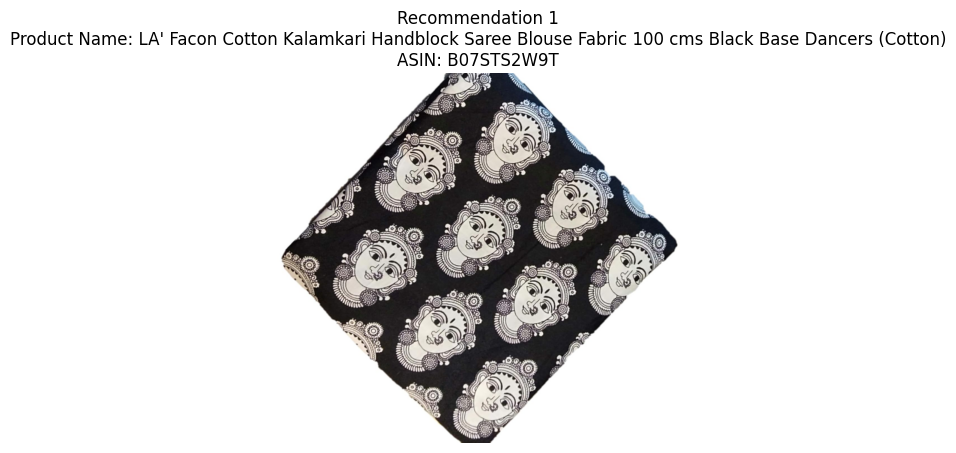

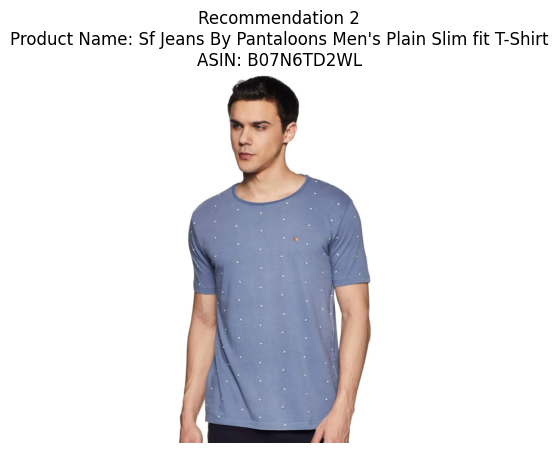

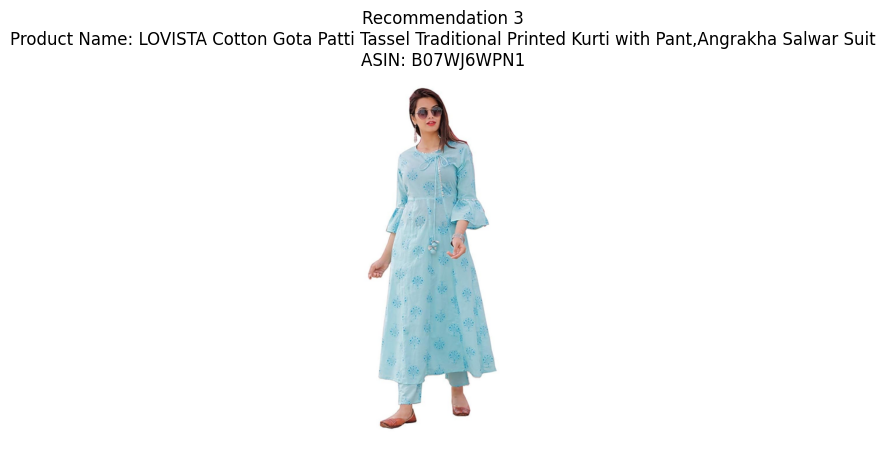

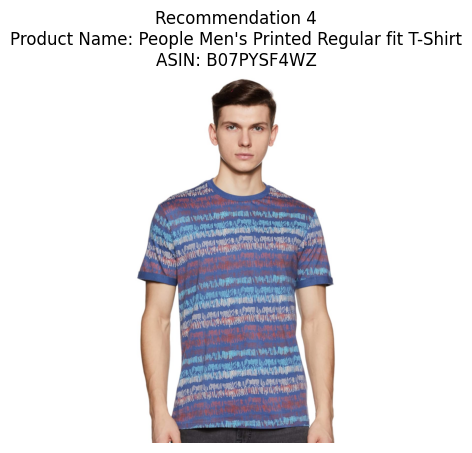

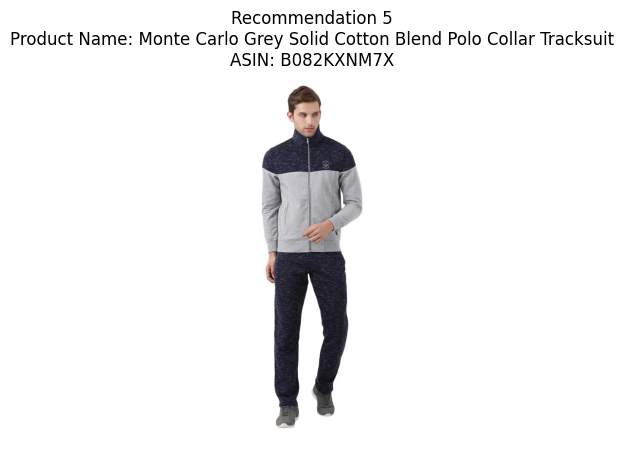

Image display complete.


In [ ]:
import pandas as pd
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt

# File path to your LDJSON file
file_path = 'fashion_products_data.ldjson'

# Step 1: Load the LDJSON file into a Pandas DataFrame
data = pd.read_json(file_path, lines=True)



# Update these to match the actual column names in your dataset
image_url_column = 'large'  # Column with image URLs
product_name_column = 'product_name'    # Column with product names
asin_column = 'asin'                    # Column with ASINs

# Ensure required columns exist
for col in [image_url_column, product_name_column, asin_column]:
    if col not in data.columns:
        raise ValueError(f"Field '{col}' not found in the dataset!")

# Step 3: Extract a sample of image URLs, product names, and ASINs
sample_data = data[[image_url_column, product_name_column, asin_column]].dropna().head(5)  # Adjust sample size as needed

# Step 4: Display images with product names and ASINs
for i, row in sample_data.iterrows():
    url = row[image_url_column]
    product_name = row[product_name_column]
    asin = row[asin_column]
    try:
        response = requests.get(url)
        response.raise_for_status()  # Check if the request was successful
        img = Image.open(BytesIO(response.content))

        # Display the image
        plt.figure()
        plt.imshow(img)
        plt.axis('off')  # Hide axes
        plt.title(f"Recommendation {i + 1}\nProduct Name: {product_name}\nASIN: {asin}")
        plt.show()
    except Exception as e:
        print(f"Could not load image from URL: {url}. Error: {e}")

print("Image display complete.")


Recommendations for: LA' Facon Cotton Kalamkari Handblock Saree Blouse Fabric 100 cms Black Base Dancers (Cotton)


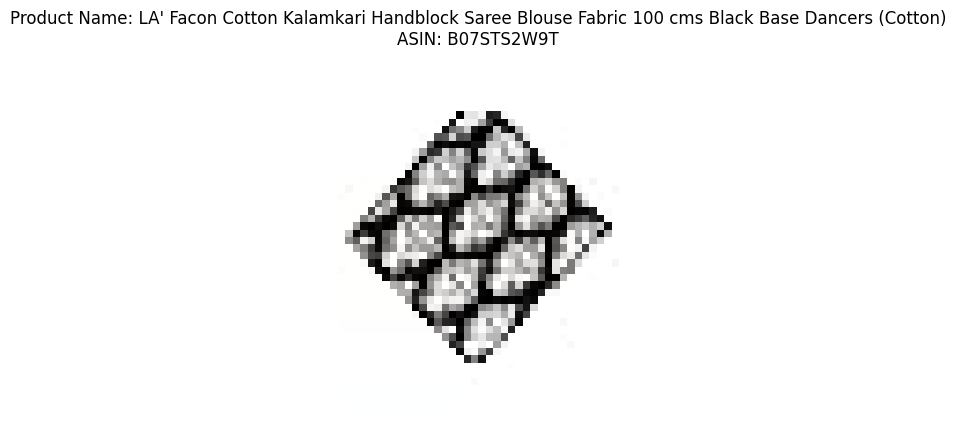

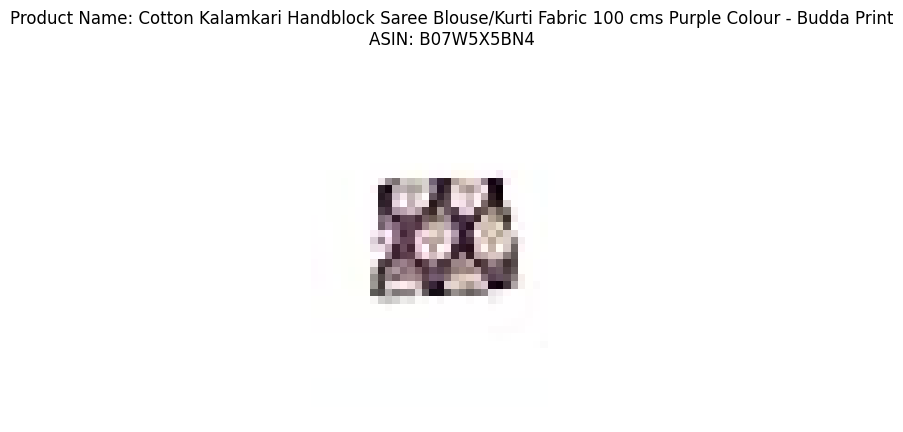

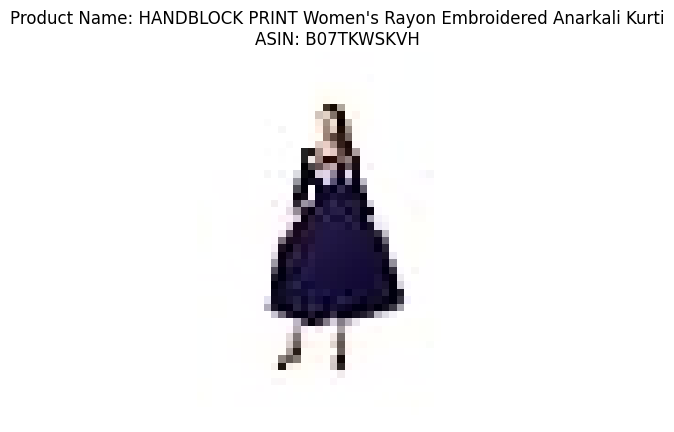

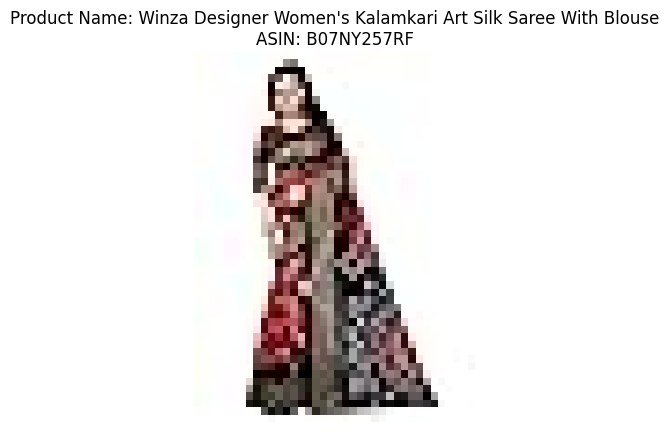

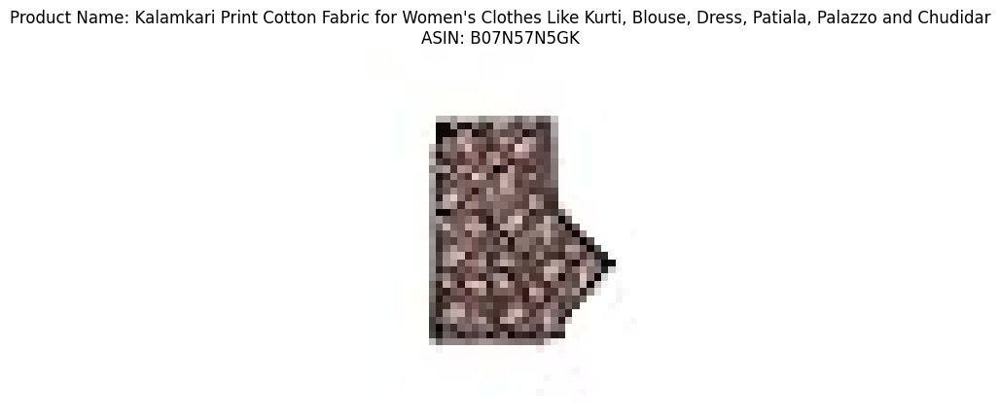

Recommendation display complete.


In [ ]:
import pandas as pd
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

# File path to your LDJSON file
file_path = 'fashion_products_data.ldjson'

# Step 1: Load the LDJSON file into a Pandas DataFrame
data = pd.read_json(file_path, lines=True)

# Update these to match the actual column names in your dataset
image_url_column = 'image_urls__small'  # Column with image URLs
product_name_column = 'product_name'    # Column with product names
asin_column = 'asin'                    # Column with ASINs

# Ensure required columns exist
for col in [image_url_column, product_name_column, asin_column]:
    if col not in data.columns:
        raise ValueError(f"Field '{col}' not found in the dataset!")

# Step 2: Compute TF-IDF and Cosine Similarity
if data[product_name_column].isnull().all():
    raise ValueError(f"All values in '{product_name_column}' are missing!")

# Replace NaN values with empty strings
data[product_name_column] = data[product_name_column].fillna("")

# Transform product names into TF-IDF vectors
vectorizer = TfidfVectorizer(stop_words='english')
tfidf_matrix = vectorizer.fit_transform(data[product_name_column])

# Compute pairwise cosine similarity
cosine_sim = cosine_similarity(tfidf_matrix)

# Step 3: Function to get top recommendations
def get_recommendations(index, cosine_sim_matrix, data, top_n=5):
    similarity_scores = list(enumerate(cosine_sim_matrix[index]))
    similarity_scores = sorted(similarity_scores, key=lambda x: x[1], reverse=True)
    top_indices = [i[0] for i in similarity_scores[1:top_n+1]]  # Skip the first one (self-similarity)
    return data.iloc[top_indices]

# Step 4: Display recommendations for the first product
product_index = 0  # You can change this index to get recommendations for a different product
recommended_products = get_recommendations(product_index, cosine_sim, data)

print(f"Recommendations for: {data.iloc[product_index][product_name_column]}")

for i, row in recommended_products.iterrows():
    url = row[image_url_column]
    product_name = row[product_name_column]
    asin = row[asin_column]
    try:
        response = requests.get(url)
        response.raise_for_status()  # Check if the request was successful
        img = Image.open(BytesIO(response.content))

        # Display the image
        plt.figure()
        plt.imshow(img)
        plt.axis('off')  # Hide axes
        plt.title(f"Product Name: {product_name}\nASIN: {asin}")
        plt.show()
    except Exception as e:
        print(f"Could not load image from URL: {url}. Error: {e}")

print("Recommendation display complete.")


High-level recommendations for: LA' Facon Cotton Kalamkari Handblock Saree Blouse Fabric 100 cms Black Base Dancers (Cotton)


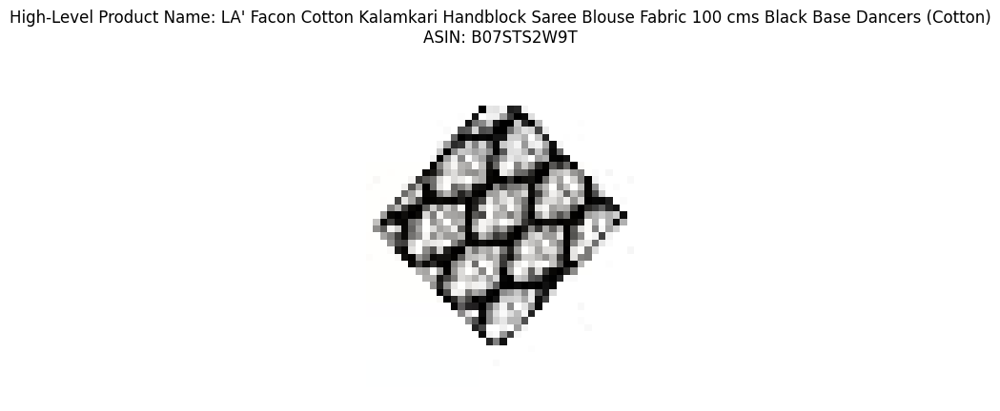

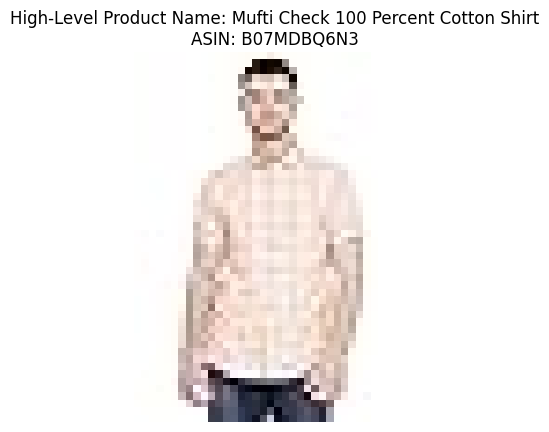

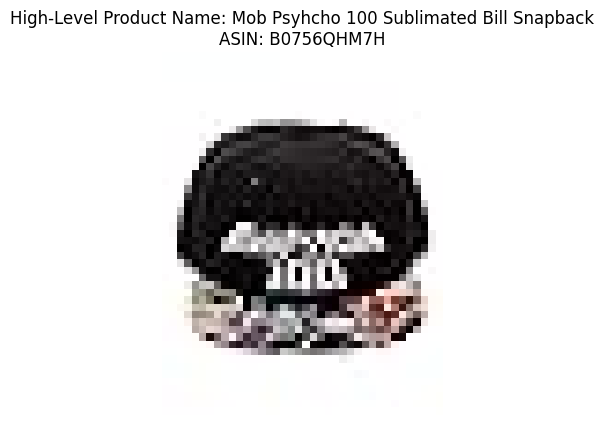

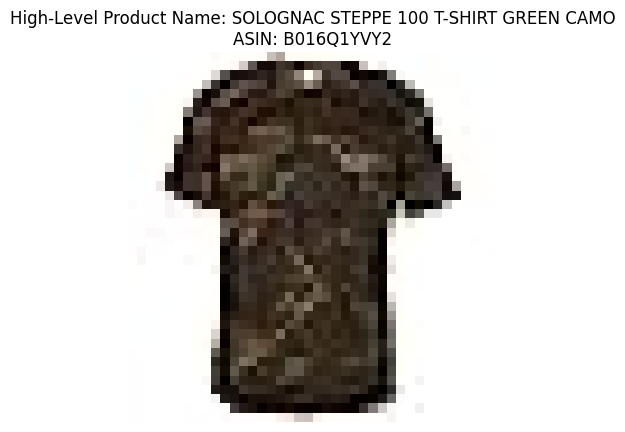

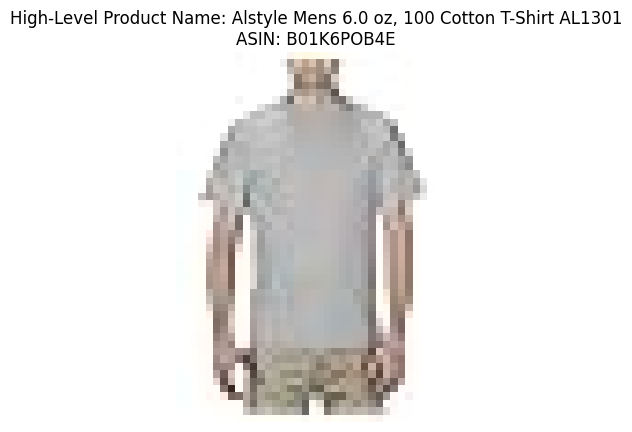

High-level recommendation display complete.


In [ ]:
import pandas as pd
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from gensim.models import Word2Vec
import numpy as np

# File path to your LDJSON file
file_path = 'fashion_products_data.ldjson'

# Step 1: Load the LDJSON file into a Pandas DataFrame
data = pd.read_json(file_path, lines=True)

# Update these to match the actual column names in your dataset
image_url_column = 'image_urls__small'  # Column with image URLs
product_name_column = 'product_name'    # Column with product names
asin_column = 'asin'                    # Column with ASINs

# Ensure required columns exist
for col in [image_url_column, product_name_column, asin_column]:
    if col not in data.columns:
        raise ValueError(f"Field '{col}' not found in the dataset!")

# Replace NaN values with empty strings
data[product_name_column] = data[product_name_column].fillna("")

# Step 2: Train Word2Vec on product names
tokenized_product_names = data[product_name_column].str.lower().str.split()
word2vec_model = Word2Vec(sentences=tokenized_product_names, vector_size=100, window=5, min_count=1, workers=4)

# Function to get the average Word2Vec vector for a product name
def get_avg_word2vec(sentence, model, vector_size):
    words = sentence.split()
    word_vectors = [model.wv[word] for word in words if word in model.wv]
    if len(word_vectors) > 0:
        return np.mean(word_vectors, axis=0)
    else:
        return np.zeros(vector_size)

# Compute Word2Vec embeddings for all products
data['word2vec_embedding'] = data[product_name_column].apply(
    lambda x: get_avg_word2vec(x, word2vec_model, 100)
)

# Step 3: Define high-level recommendation function using Word2Vec
def get_word2vec_recommendations(product_index, data, top_n=5):
    target_vector = data.iloc[product_index]['word2vec_embedding']
    all_vectors = np.stack(data['word2vec_embedding'].to_numpy())
    similarities = cosine_similarity([target_vector], all_vectors)[0]
    similarity_scores = list(enumerate(similarities))
    similarity_scores = sorted(similarity_scores, key=lambda x: x[1], reverse=True)
    top_indices = [i[0] for i in similarity_scores[1:top_n+1]]  # Skip the first one (self-similarity)
    return data.iloc[top_indices]

# Step 4: Display high-level recommendations for a specific product
product_index = 0  # You can change this index for another product
high_level_recommendations = get_word2vec_recommendations(product_index, data)

print(f"High-level recommendations for: {data.iloc[product_index][product_name_column]}")

for i, row in high_level_recommendations.iterrows():
    url = row[image_url_column]
    product_name = row[product_name_column]
    asin = row[asin_column]
    try:
        response = requests.get(url)
        response.raise_for_status()  # Check if the request was successful
        img = Image.open(BytesIO(response.content))

        # Display the image
        plt.figure()
        plt.imshow(img)
        plt.axis('off')  # Hide axes
        plt.title(f"High-Level Product Name: {product_name}\nASIN: {asin}")
        plt.show()
    except Exception as e:
        print(f"Could not load image from URL: {url}. Error: {e}")

print("High-level recommendation display complete.")


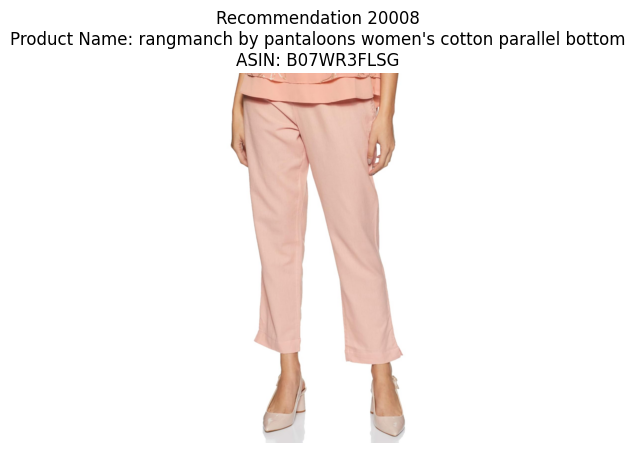

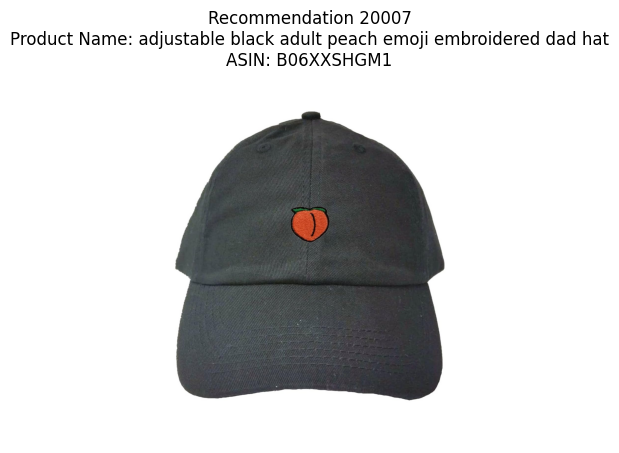

Could not load image from URL: nan. Error: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


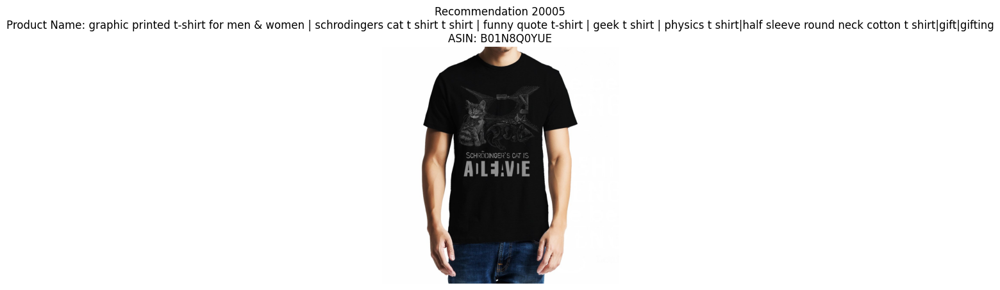

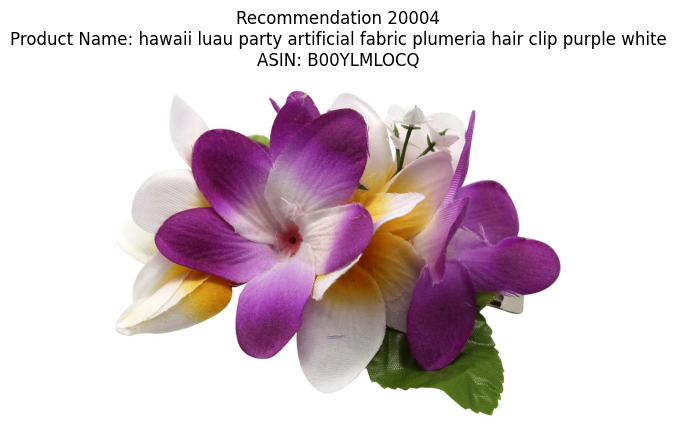

Recommendation display complete.


In [ ]:
import pandas as pd
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from gensim.models import Word2Vec
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

# File path to your LDJSON file
file_path = 'fashion_products_data.ldjson'

# Step 1: Load the LDJSON file into a Pandas DataFrame
try:
    data = pd.read_json(file_path, lines=True)
except Exception as e:
    raise FileNotFoundError(f"Error loading file: {e}")

# Update these to match the actual column names in your dataset
image_url_column = 'large'  # Column with image URLs
product_name_column = 'product_name'    # Column with product names
asin_column = 'asin'                    # Column with ASINs

# Ensure required columns exist
for col in [image_url_column, product_name_column, asin_column]:
    if col not in data.columns:
        raise ValueError(f"Field '{col}' not found in the dataset!")

# Step 2: Preprocess text for Word2Vec and TF-IDF
data[product_name_column] = data[product_name_column].fillna("").str.lower()

# Step 3: Train a Word2Vec model on product names
product_names = data[product_name_column].str.split()  # Tokenize
w2v_model = Word2Vec(sentences=product_names, vector_size=100, window=5, min_count=2, workers=4)

# Step 4: Create TF-IDF vectors
tfidf_vectorizer = TfidfVectorizer()
tfidf_matrix = tfidf_vectorizer.fit_transform(data[product_name_column])

# Function to get TF-IDF weighted Word2Vec embeddings
def get_tfidf_w2v_embedding(text):
    words = text.split()
    tfidf_weights = tfidf_vectorizer.transform([" ".join(words)]).toarray()[0]
    word_vectors = [w2v_model.wv[word] * tfidf_weights[i]
                    for i, word in enumerate(words) if word in w2v_model.wv]
    if word_vectors:
        return np.mean(word_vectors, axis=0)  # Average weighted vectors
    else:
        return np.zeros(w2v_model.vector_size)

# Step 5: Compute similarity matrix
data['embedding'] = data[product_name_column].apply(get_tfidf_w2v_embedding)
embedding_matrix = np.stack(data['embedding'].to_numpy())
similarity_matrix = cosine_similarity(embedding_matrix)

# Step 6: Generate recommendations for the first product
product_index = 0  # Adjust as needed
top_indices = np.argsort(-similarity_matrix[product_index])[1:6]  # Top 5 recommendations

# Step 7: Display recommended products
sample_data = data.iloc[top_indices]

for i, row in sample_data.iterrows():
    url = row[image_url_column]
    product_name = row[product_name_column]
    asin = row[asin_column]
    try:
        response = requests.get(url)
        response.raise_for_status()  # Check if the request was successful
        img = Image.open(BytesIO(response.content))

        # Display the image
        plt.figure()
        plt.imshow(img)
        plt.axis('off')  # Hide axes
        plt.title(f"Recommendation {i + 1}\nProduct Name: {product_name}\nASIN: {asin}")
        plt.show()
    except Exception as e:
        print(f"Could not load image from URL: {url}. Error: {e}")

print("Recommendation display complete.")


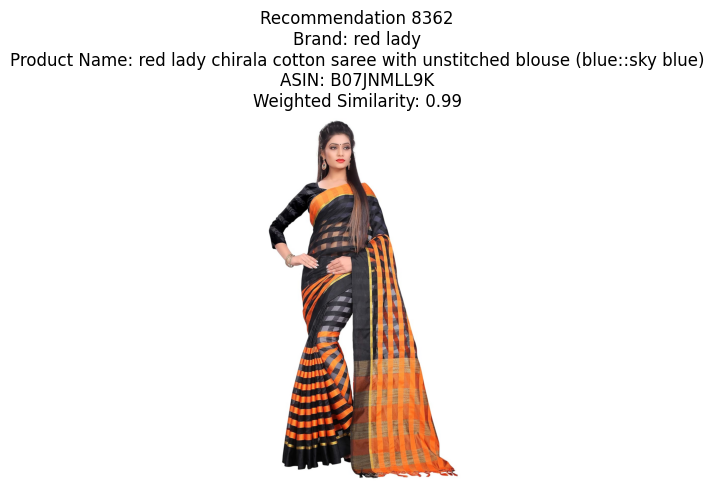

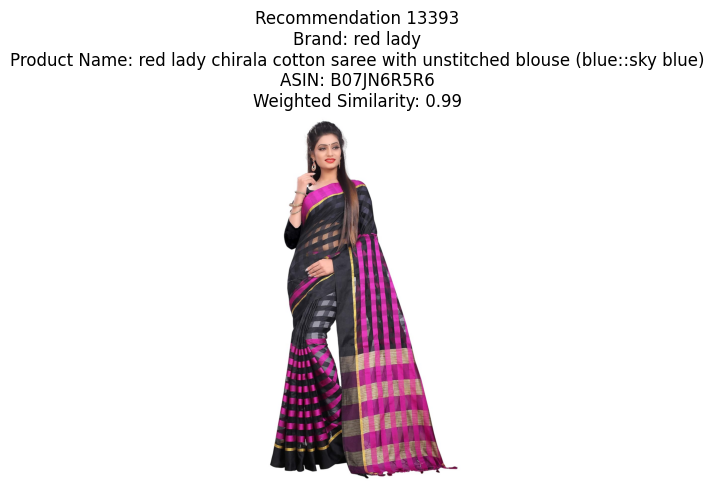

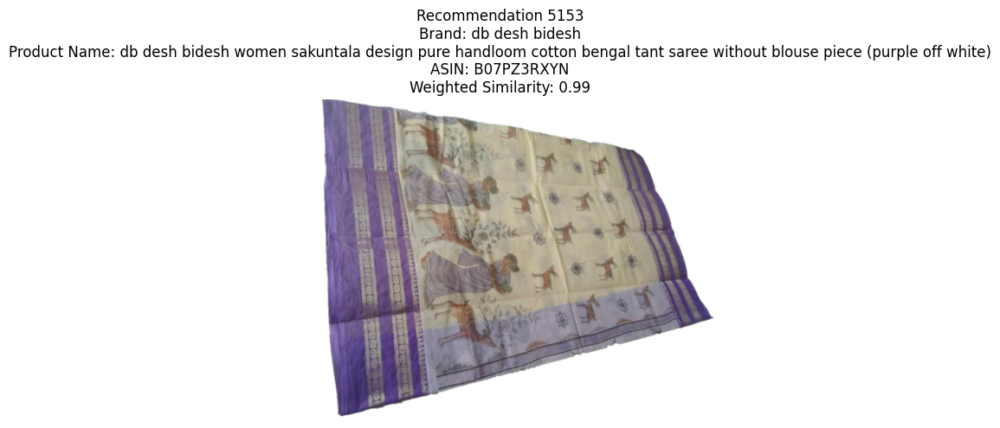

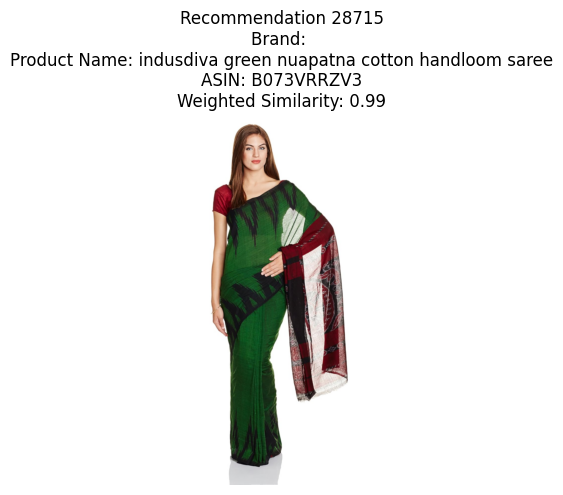

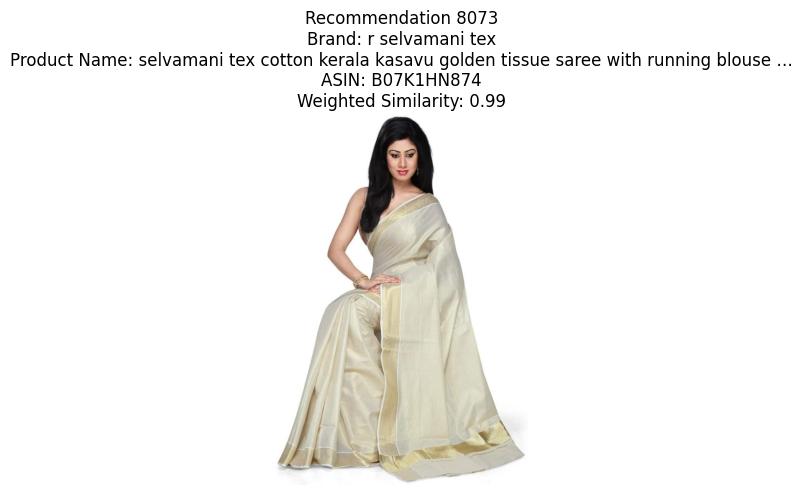

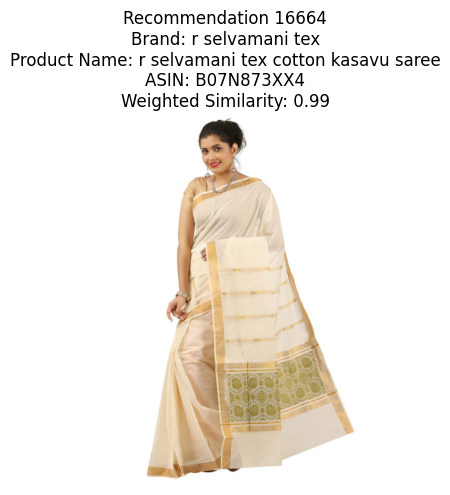

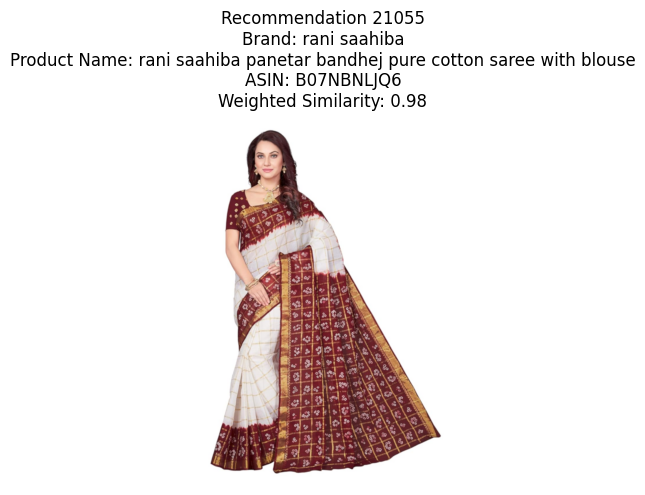

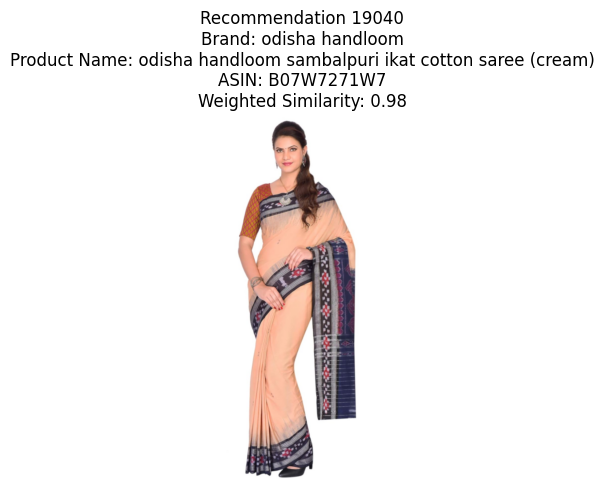

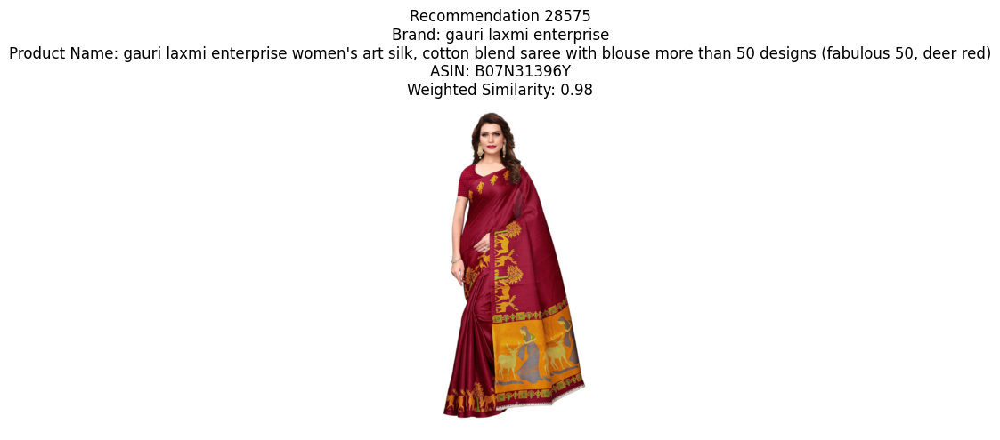

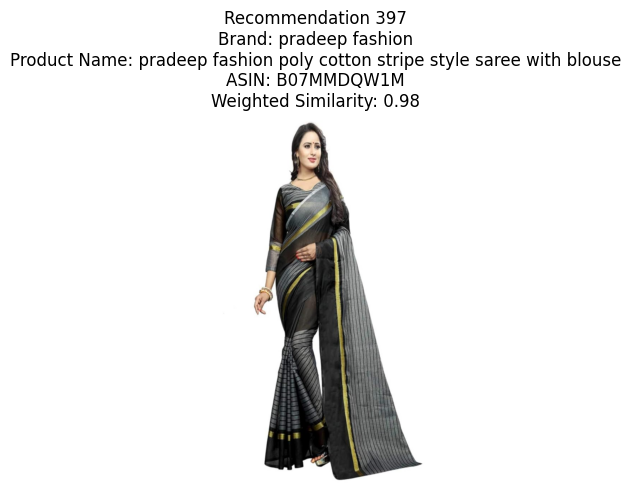

Brand-weighted recommendations complete.


In [ ]:
import pandas as pd
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
from gensim.models import Word2Vec
import numpy as np

# File path to your LDJSON file
file_path = 'fashion_products_data.ldjson'

# Step 1: Load the LDJSON file into a Pandas DataFrame
try:
    data = pd.read_json(file_path, lines=True)
except Exception as e:
    raise FileNotFoundError(f"Error loading file: {e}")

# Update these to match the actual column names in your dataset
image_url_column = 'large'  # Column with image URLs
product_name_column = 'product_name'    # Column with product names
asin_column = 'asin'                    # Column with ASINs
brand_column = 'brand'                  # Column with brand names

# Ensure required columns exist
for col in [image_url_column, product_name_column, asin_column, brand_column]:
    if col not in data.columns:
        raise ValueError(f"Field '{col}' not found in the dataset!")

# Step 2: Preprocess data
data[product_name_column] = data[product_name_column].fillna("").str.lower()
data[brand_column] = data[brand_column].fillna("").str.lower()

# Add brand weights (manually assigned for now)
brand_weights = {'brand_a': 1.5, 'brand_b': 1.2, 'brand_c': 1.0}  # Example brand weights
data['brand_weight'] = data[brand_column].map(brand_weights).fillna(1.0)

# Step 3: Train a Word2Vec model on product names
product_names = data[product_name_column].str.split()  # Tokenize
w2v_model = Word2Vec(sentences=product_names, vector_size=100, window=5, min_count=2, workers=4)

# Function to get Word2Vec embedding
def get_w2v_embedding(text):
    words = text.split()
    word_vectors = [w2v_model.wv[word] for word in words if word in w2v_model.wv]
    if word_vectors:
        return np.mean(word_vectors, axis=0)  # Average vectors
    else:
        return np.zeros(w2v_model.vector_size)

# Step 4: Compute Word2Vec embeddings for all products
data['embedding'] = data[product_name_column].apply(get_w2v_embedding)

# Step 5: Generate recommendations considering brand weight and priority
def get_weighted_recommendations(product_asin, top_n=10, include_other_brands=True):
    # Get the selected product's details
    product_info = data[data[asin_column] == product_asin]
    if product_info.empty:
        raise ValueError("Product ASIN not found in the dataset!")
    selected_brand = product_info[brand_column].iloc[0]
    selected_embedding = product_info['embedding'].iloc[0]

    # Calculate similarity for all products
    data['similarity'] = data['embedding'].apply(
        lambda x: np.dot(selected_embedding, x) / (np.linalg.norm(selected_embedding) * np.linalg.norm(x))
        if np.linalg.norm(x) > 0 else 0
    )

    # Apply brand weight to similarity score
    data['weighted_similarity'] = data['similarity'] * data['brand_weight']

    # Filter recommendations
    if not include_other_brands:
        brand_data = data[data[brand_column] == selected_brand]
    else:
        brand_data = data

    # Exclude the selected product and sort by weighted similarity
    recommendations = brand_data[brand_data[asin_column] != product_asin].nlargest(top_n, 'weighted_similarity')
    return recommendations

# Step 6: Display recommendations for a sample product
sample_asin = data[asin_column].iloc[0]  # Replace with a specific ASIN as needed
try:
    recommendations = get_weighted_recommendations(sample_asin, top_n=10, include_other_brands=True)
    for i, row in recommendations.iterrows():
        url = row[image_url_column]
        product_name = row[product_name_column]
        asin = row[asin_column]
        brand = row[brand_column]
        weighted_similarity = row['weighted_similarity']
        try:
            response = requests.get(url)
            response.raise_for_status()  # Check if the request was successful
            img = Image.open(BytesIO(response.content))

            # Display the image
            plt.figure()
            plt.imshow(img)
            plt.axis('off')  # Hide axes
            plt.title(f"Recommendation {i + 1}\nBrand: {brand}\nProduct Name: {product_name}\nASIN: {asin}\nWeighted Similarity: {weighted_similarity:.2f}")
            plt.show()
        except Exception as e:
            print(f"Could not load image from URL: {url}. Error: {e}")
except Exception as e:
    print(f"Error generating recommendations: {e}")

print("Brand-weighted recommendations complete.")


In [ ]:
pip install gensim pandas matplotlib pillow requests


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Brands similar to 'gucci': []


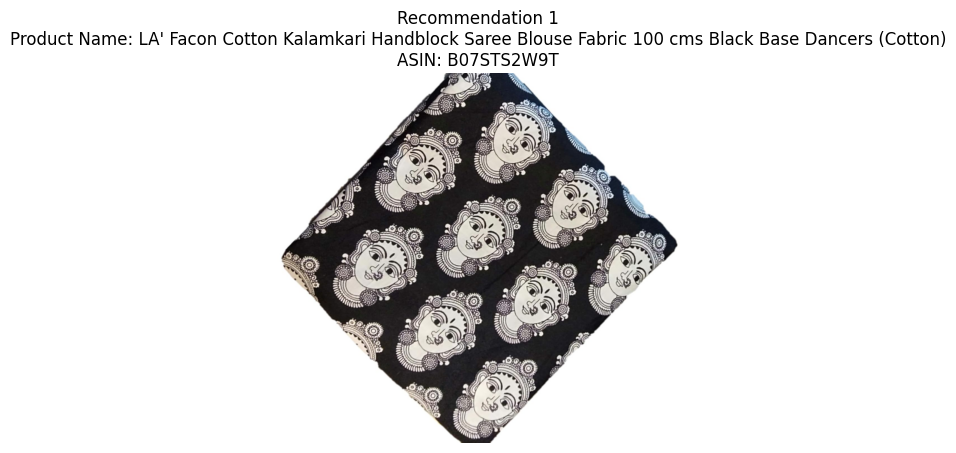

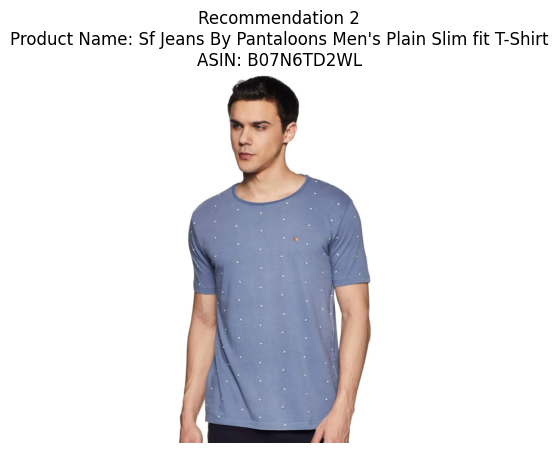

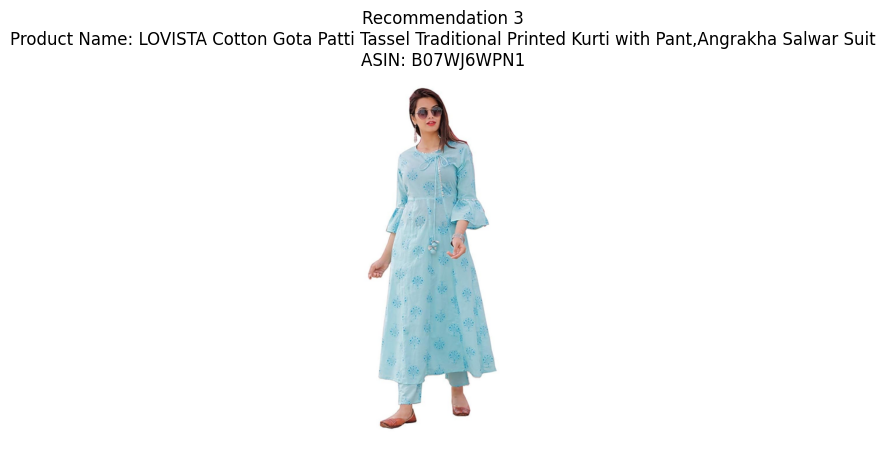

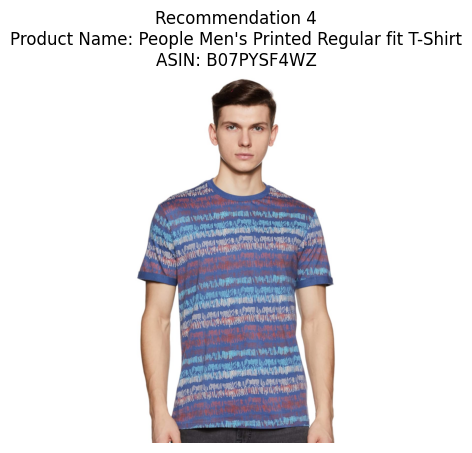

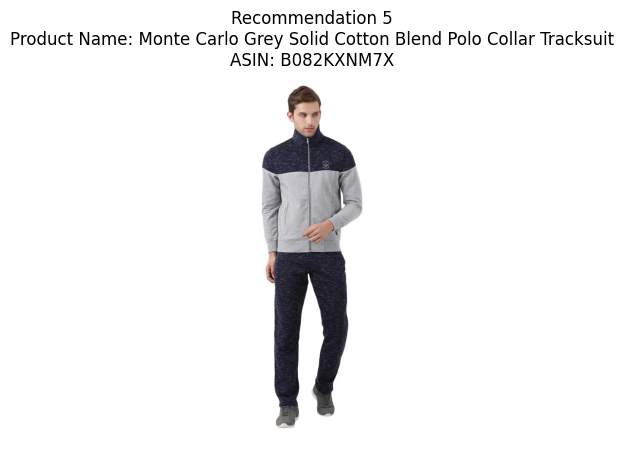

Image display complete.


In [ ]:
import pandas as pd
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
from gensim.models import Word2Vec
from nltk.tokenize import word_tokenize
import nltk

# Ensure you have the NLTK tokenizer
nltk.download('punkt')

# File path to your LDJSON file
file_path = 'fashion_products_data.ldjson'

# Step 1: Load the LDJSON file into a Pandas DataFrame
data = pd.read_json(file_path, lines=True)

# Update these to match the actual column names in your dataset
image_url_column = 'large'  # Column with image URLs
product_name_column = 'product_name'    # Column with product names
asin_column = 'asin'                    # Column with ASINs

# Ensure required columns exist
for col in [image_url_column, product_name_column, asin_column]:
    if col not in data.columns:
        raise ValueError(f"Field '{col}' not found in the dataset!")

# Step 2: Preprocess product names for Word2Vec
product_names = data[product_name_column].dropna().astype(str).tolist()
tokenized_names = [word_tokenize(name.lower()) for name in product_names]

# Step 3: Train a Word2Vec model on the tokenized product names
model = Word2Vec(sentences=tokenized_names, vector_size=100, window=5, min_count=1, workers=4)

# Step 4: Define a function for brand-based recommendations
def recommend_similar_brands(target_brand, model, top_n=5):
    try:
        similar_brands = model.wv.most_similar(target_brand, topn=top_n)
        return [brand for brand, similarity in similar_brands]
    except KeyError:
        return []

# Example: Recommend high-class brands related to "gucci"
target_brand = 'gucci'
recommended_brands = recommend_similar_brands(target_brand, model)
print(f"Brands similar to '{target_brand}': {recommended_brands}")

# Step 5: Display recommendations with images
sample_data = data[data[product_name_column].str.contains('|'.join(recommended_brands), na=False, case=False, regex=True)]
sample_data = sample_data[[image_url_column, product_name_column, asin_column]].dropna().head(5)

# Display images with product names and ASINs
for i, row in sample_data.iterrows():
    url = row[image_url_column]
    product_name = row[product_name_column]
    asin = row[asin_column]
    try:
        response = requests.get(url)
        response.raise_for_status()  # Check if the request was successful
        img = Image.open(BytesIO(response.content))

        # Display the image
        plt.figure()
        plt.imshow(img)
        plt.axis('off')  # Hide axes
        plt.title(f"Recommendation {i + 1}\nProduct Name: {product_name}\nASIN: {asin}")
        plt.show()
    except Exception as e:
        print(f"Could not load image from URL: {url}. Error: {e}")

print("Image display complete.")


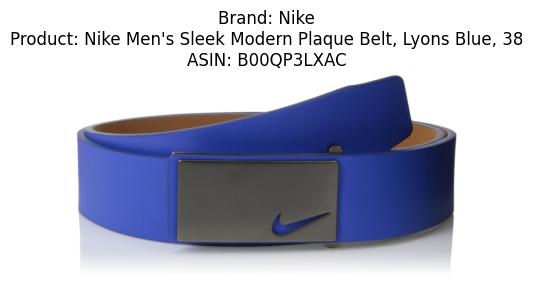

Could not load image from URL: nan. Error: Invalid URL 'nan': No scheme supplied. Perhaps you meant https://nan?


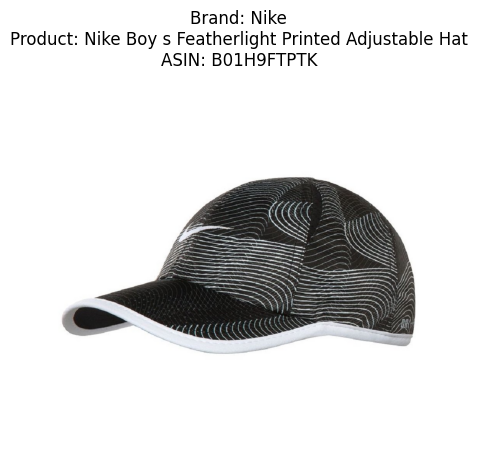

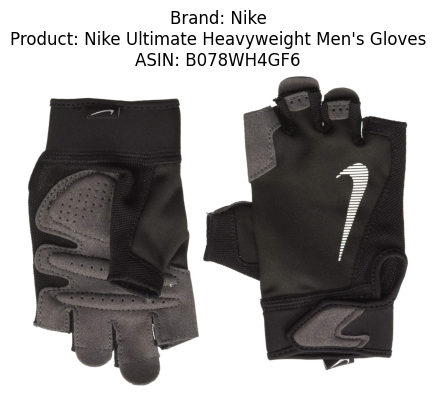

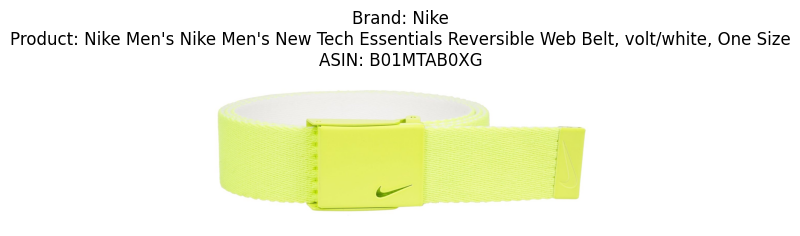

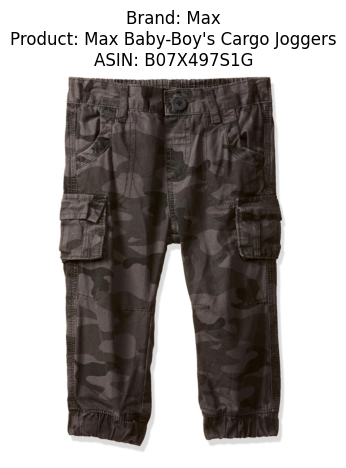

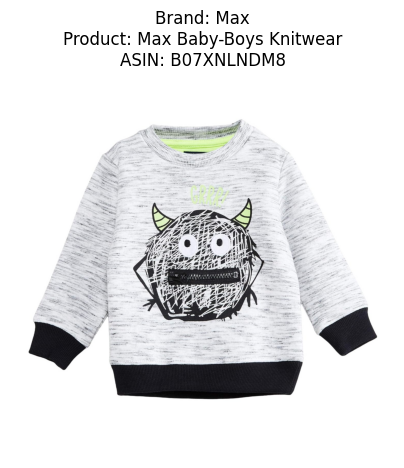

...

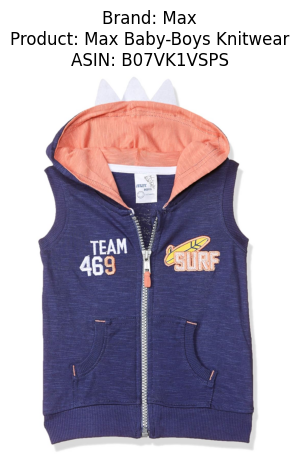

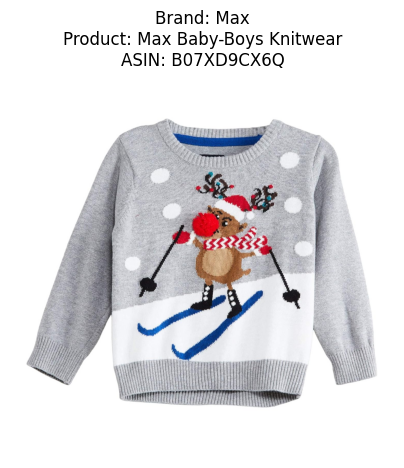

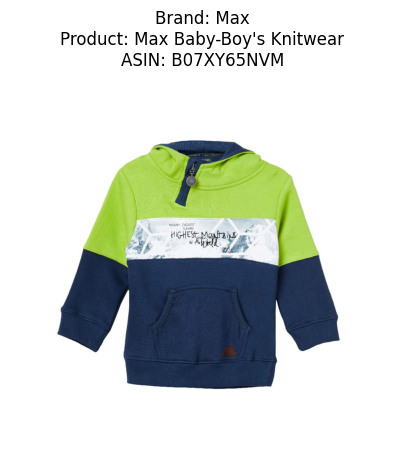

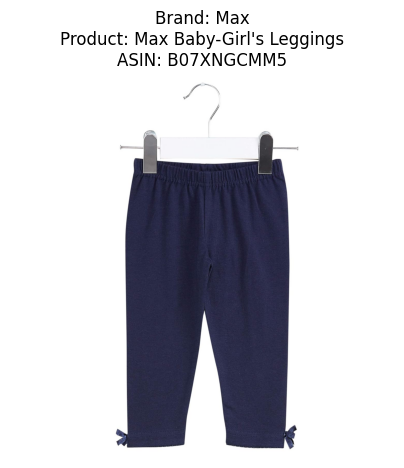

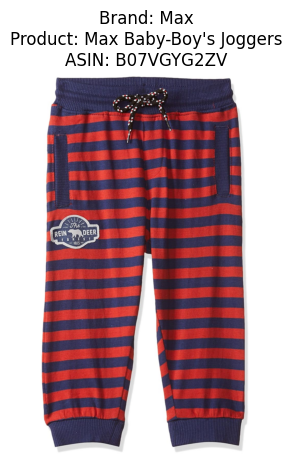

Recommendations complete.


In [ ]:
import pandas as pd
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
from gensim.models import Word2Vec
import numpy as np  # Import NumPy for vector operations

# File path to your LDJSON file
file_path = 'fashion_products_data.ldjson'

# Step 1: Load the LDJSON file into a Pandas DataFrame
data = pd.read_json(file_path, lines=True)

# Update these to match the actual column names in your dataset
brand_column = 'brand'                   # Column with brand names
image_url_column = 'large'               # Column with image URLs
product_name_column = 'product_name'     # Column with product names
rating_column = 'rating'                 # Column with product ratings
asin_column = 'asin'                     # Column with ASINs

# Ensure required columns exist
required_columns = [brand_column, image_url_column, product_name_column, rating_column, asin_column]
for col in required_columns:
    if col not in data.columns:
        raise ValueError(f"Field '{col}' not found in the dataset!")

# Step 2: Preprocess data for Word2Vec
product_names = data[product_name_column].dropna().str.split().tolist()

# Step 3: Train a Word2Vec model
word2vec_model = Word2Vec(sentences=product_names, vector_size=100, window=5, min_count=2, workers=4)

# Step 4: Get vector representation for each product
def get_vector(text):
    tokens = text.split()
    vectors = [word2vec_model.wv[word] for word in tokens if word in word2vec_model.wv]
    if vectors:
        return sum(vectors) / len(vectors)
    else:
        return None

data['vector'] = data[product_name_column].apply(lambda x: get_vector(x) if isinstance(x, str) else None)

# Step 5: Define a target product for recommendations
target_product = "Air Max Sneakers"  # Replace with a product of your choice
target_vector = get_vector(target_product)

# Step 6: Calculate similarity with the target product
def calculate_similarity(vec1, vec2):
    if vec1 is not None and vec2 is not None:
        return vec1.dot(vec2) / (np.linalg.norm(vec1) * np.linalg.norm(vec2))
    else:
        return 0

data['similarity'] = data['vector'].apply(lambda x: calculate_similarity(x, target_vector))

# Step 7: Generate brand weights and priority
brand_weights = data.groupby(brand_column).agg(
    avg_similarity=('similarity', 'mean'),
    product_count=(product_name_column, 'count')
).reset_index()

brand_weights['brand_priority'] = brand_weights['avg_similarity'] * brand_weights['product_count']
brand_weights = brand_weights.sort_values(by='brand_priority', ascending=False)

# Step 8: Recommend products
target_brand = "Nike"  # Change to the brand of interest
target_brand_products = data[data[brand_column] == target_brand].sort_values(by='similarity', ascending=False).head(5)

recommended_brands = brand_weights[brand_weights[brand_column] != target_brand].head(3)
recommended_products = data[data[brand_column].isin(recommended_brands[brand_column])].sort_values(by='similarity', ascending=False).head(10)

# Combine target and recommended products for display
recommendation_df = pd.concat([target_brand_products, recommended_products])

# Display recommendations in tabular format
def display_recommendations_table(recommendation_df):
    for _, row in recommendation_df.iterrows():
        url = row[image_url_column]
        product_name = row[product_name_column]
        asin = row[asin_column]
        brand = row[brand_column]
        try:
            response = requests.get(url)
            response.raise_for_status()
            img = Image.open(BytesIO(response.content))

            # Display product in a figure
            plt.figure(figsize=(5, 5))
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"Brand: {brand}\nProduct: {product_name}\nASIN: {asin}")
            plt.show()
        except Exception as e:
            print(f"Could not load image from URL: {url}. Error: {e}")

# Call the display function
display_recommendations_table(recommendation_df)

print("Recommendations complete.")


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 550ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 543ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 540ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 581ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 534ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 526ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 550ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 544ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 528ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 537ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 547ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 915ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 985ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Target Image:


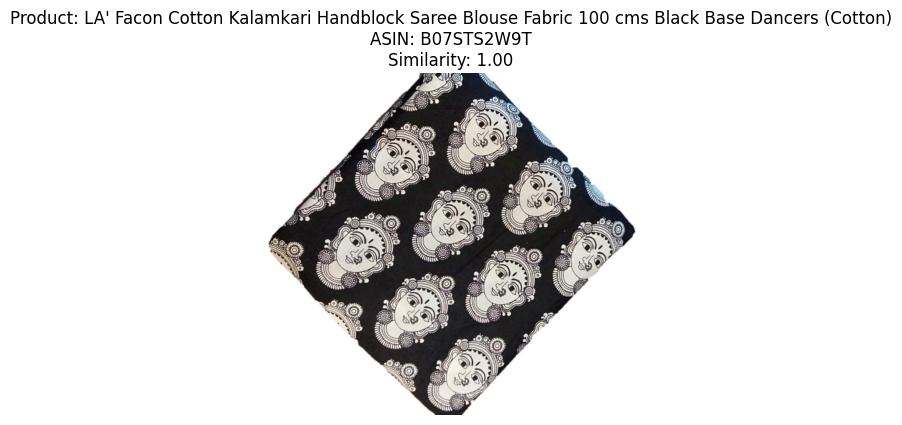

Recommended Images:


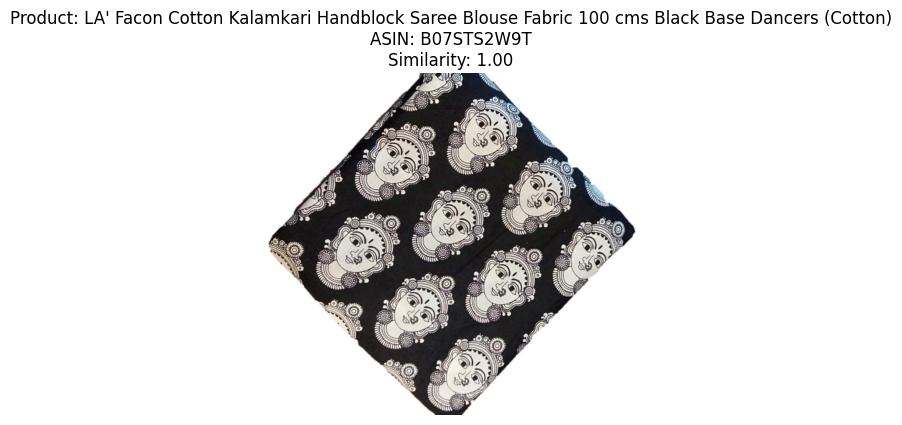

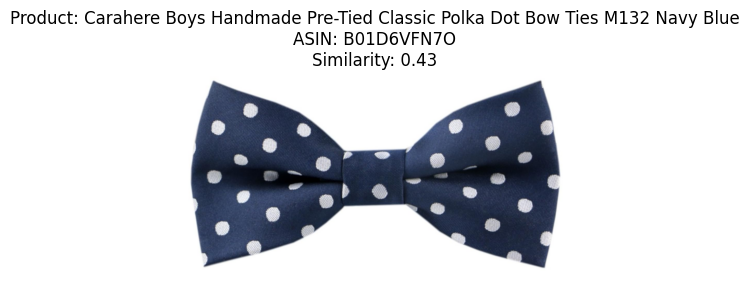

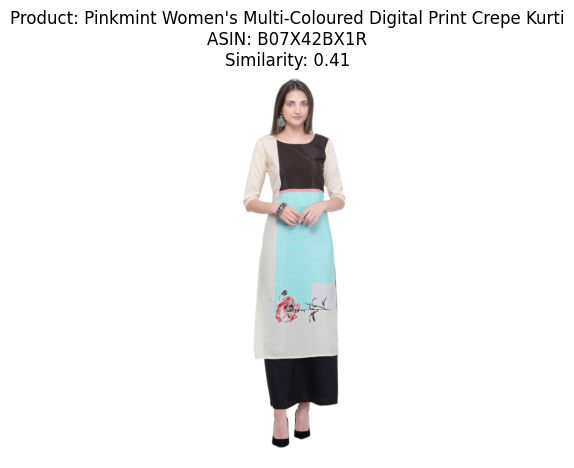

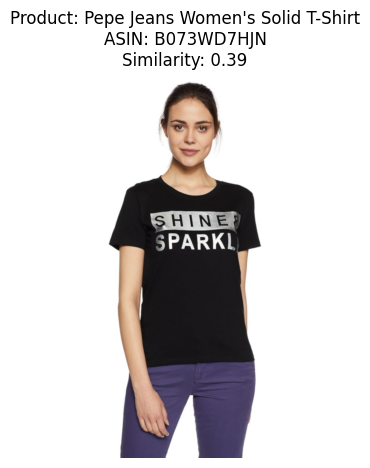

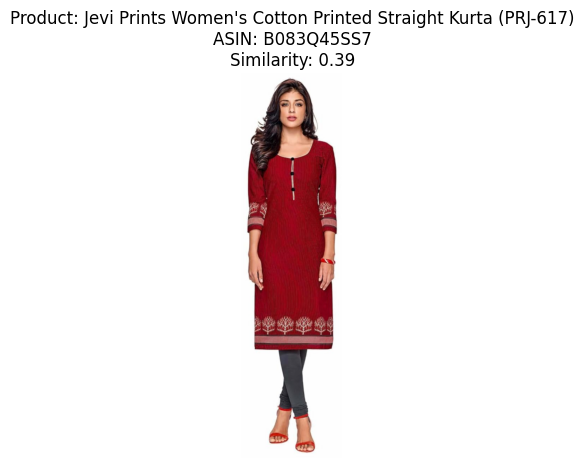

In [ ]:
import pandas as pd
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.preprocessing.image import img_to_array

# File path to your LDJSON file
file_path = 'fashion_products_data.ldjson'

# Step 1: Load the LDJSON file into a Pandas DataFrame
data = pd.read_json(file_path, lines=True)

# Update these to match the actual column names in your dataset
image_url_column = 'large'               # Column with image URLs
product_name_column = 'product_name'    # Column with product names
asin_column = 'asin'                    # Column with ASINs

# Ensure required columns exist
required_columns = [image_url_column, product_name_column, asin_column]
for col in required_columns:
    if col not in data.columns:
        raise ValueError(f"Field '{col}' not found in the dataset!")

# Step 2: Extract image URLs and preprocess
sample_data = data[[image_url_column, product_name_column, asin_column]].dropna().head(20)  # Adjust sample size

# Step 3: Load a pre-trained VGG16 model for feature extraction
vgg16_model = VGG16(weights='imagenet', include_top=False, pooling='avg')

def get_image_vector(image_url):
    """Fetch image from URL and convert it to a feature vector."""
    try:
        response = requests.get(image_url)
        response.raise_for_status()
        img = Image.open(BytesIO(response.content)).resize((224, 224)).convert('RGB')
        img_array = img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array = preprocess_input(img_array)
        feature_vector = vgg16_model.predict(img_array)
        return feature_vector.flatten()
    except Exception as e:
        print(f"Error loading image from {image_url}: {e}")
        return None

# Step 4: Compute feature vectors for all images
sample_data['image_vector'] = sample_data[image_url_column].apply(get_image_vector)
sample_data = sample_data.dropna(subset=['image_vector'])

# Step 5: Define a target image for recommendation
target_index = 0  # Change this to select a different target
target_vector = sample_data.iloc[target_index]['image_vector']

# Step 6: Calculate similarity with the target image
sample_data['similarity'] = sample_data['image_vector'].apply(
    lambda x: cosine_similarity([x], [target_vector])[0][0]
)

# Step 7: Sort by similarity to get recommendations
recommendations = sample_data.sort_values(by='similarity', ascending=False).head(5)

# Step 8: Visualize recommendations in a tabular format
def display_recommendations(recommendations):
    """Display recommendations with images, product names, and similarity scores."""
    for _, row in recommendations.iterrows():
        url = row[image_url_column]
        product_name = row[product_name_column]
        asin = row[asin_column]
        similarity = row['similarity']
        try:
            response = requests.get(url)
            response.raise_for_status()
            img = Image.open(BytesIO(response.content))

            # Display product in a figure
            plt.figure(figsize=(5, 5))
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"Product: {product_name}\nASIN: {asin}\nSimilarity: {similarity:.2f}")
            plt.show()
        except Exception as e:
            print(f"Could not load image from URL: {url}. Error: {e}")

# Display target image
print("Target Image:")
display_recommendations(sample_data.iloc[[target_index]])

# Display recommended images
print("Recommended Images:")
display_recommendations(recommendations)


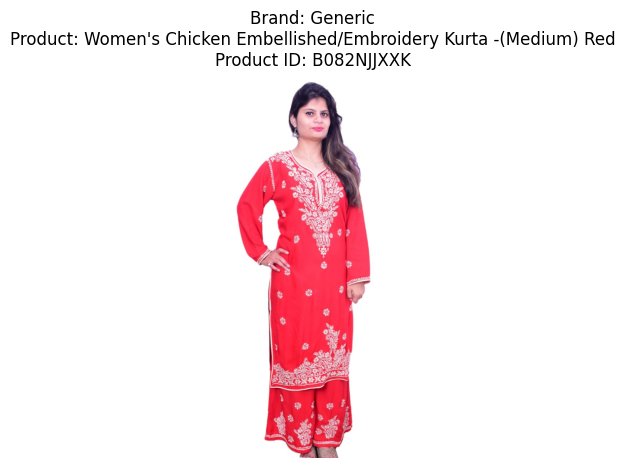

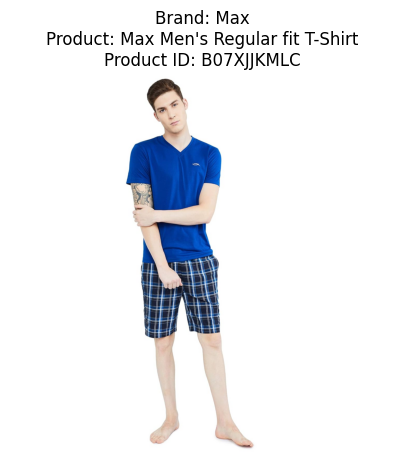

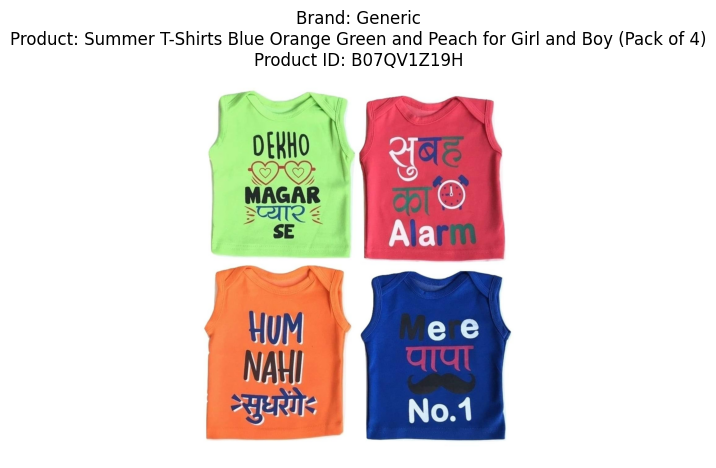

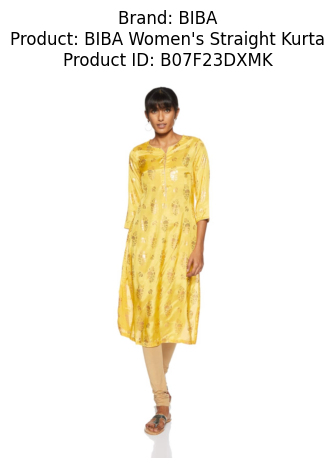

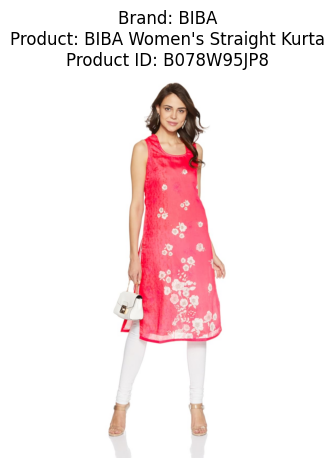

In [ ]:
import pandas as pd
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt

# File path to your LDJSON file
file_path = 'fashion_products_data.ldjson'

# Step 1: Load the LDJSON file into a Pandas DataFrame
data = pd.read_json(file_path, lines=True)

# Update these column names to match your dataset
brand_column = 'brand'                 # Column for brand names
product_id_column = 'asin'       # Column for product IDs
rating_column = 'rating'               # Column for product ratings
image_url_column = 'large'             # Column for product image URLs
product_name_column = 'product_name'   # Column for product names
similarity_column = 'similarity'       # Placeholder column for similarity calculation

# Step 2: Add a placeholder similarity column (example: dummy similarity scores)
if similarity_column not in data.columns:
    data[similarity_column] = pd.Series([1.0 for _ in range(len(data))])  # Replace with actual similarity if available

# Step 3: Group by brand and calculate brand weight and priority
brand_stats = data.groupby(brand_column).agg(
    avg_similarity=('similarity', 'mean'),    # Average similarity of products within the brand
    product_count=(product_id_column, 'count'),  # Number of products in the brand
    avg_rating=('rating', 'mean')            # Average rating of products within the brand
).reset_index()

# Calculate brand priority
brand_stats['brand_priority'] = brand_stats['avg_similarity'] * brand_stats['product_count']

# Sort brands by priority
brand_stats = brand_stats.sort_values(by='brand_priority', ascending=False)

# Step 4: Generate recommendations for the top brands
top_brands = brand_stats.head(3)  # Top 3 brands (adjust as needed)
recommended_products = data[data[brand_column].isin(top_brands[brand_column])]



# Step 6: Visualize recommended products
def display_products_in_figure(products):
    for _, row in products.iterrows():
        url = row[image_url_column]
        product_name = row[product_name_column]
        product_id = row[product_id_column]
        brand = row[brand_column]
        try:
            response = requests.get(url)
            response.raise_for_status()
            img = Image.open(BytesIO(response.content))

            # Display product in a figure
            plt.figure(figsize=(5, 5))
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"Brand: {brand}\nProduct: {product_name}\nProduct ID: {product_id}")
            plt.show()
        except Exception as e:
            print(f"Could not load image from URL: {url}. Error: {e}")

# Call the display function for top recommended products
display_products_in_figure(recommended_products.head(5))  # Visualize top 5 products


In [ ]:
import pandas as pd
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
from gensim.models import Word2Vec
import numpy as np

# File path to your LDJSON file
file_path = 'fashion_products_data.ldjson'

# Step 1: Load the LDJSON file into a Pandas DataFrame
data = pd.read_json(file_path, lines=True)

# Update these column names to match your dataset
brand_column = 'brand'                 # Column with brand names
product_id_column = 'asin'       # Column with product IDs
product_name_column = 'product_name'   # Column with product names
image_url_column = 'large'             # Column with product image URLs
rating_column = 'rating'               # Column with product ratings

# Ensure all required columns exist
required_columns = [brand_column, product_id_column, product_name_column, image_url_column]
for col in required_columns:
    if col not in data.columns:
        raise ValueError(f"Field '{col}' not found in the dataset!")

# Step 2: Prepare data for Word2Vec
data['product_name_tokens'] = data[product_name_column].str.split().dropna()  # Tokenize product names
tokenized_names = data['product_name_tokens'].tolist()

# Step 3: Train a Word2Vec model
word2vec_model = Word2Vec(sentences=tokenized_names, vector_size=100, window=5, min_count=2, workers=4)

# Step 4: Calculate Word2Vec vector for each product
def calculate_vector(tokens):
    vectors = [word2vec_model.wv[word] for word in tokens if word in word2vec_model.wv]
    return np.mean(vectors, axis=0) if vectors else np.zeros(word2vec_model.vector_size)

data['product_vector'] = data['product_name_tokens'].apply(calculate_vector)

# Step 5: Define a target product for recommendations
target_product_id = '123456'  # Replace with a valid product_id from your dataset
target_vector = data.loc[data[product_id_column] == target_product_id, 'product_vector'].values[0]

# Step 6: Calculate similarity scores
def cosine_similarity(vec1, vec2):
    if vec1 is not None and vec2 is not None and np.linalg.norm(vec1) > 0 and np.linalg.norm(vec2) > 0:
        return np.dot(vec1, vec2) / (np.linalg.norm(vec1) * np.linalg.norm(vec2))
    return 0

data['similarity'] = data['product_vector'].apply(lambda vec: cosine_similarity(vec, target_vector))

# Step 7: Calculate brand weight and priority
brand_stats = data.groupby(brand_column).agg(
    avg_similarity=('similarity', 'mean'),
    product_count=(product_id_column, 'count')
).reset_index()
brand_stats['brand_priority'] = brand_stats['avg_similarity'] * brand_stats['product_count']
brand_stats = brand_stats.sort_values(by='brand_priority', ascending=False)

# Step 8: Select top recommended products
top_brands = brand_stats.head(3)[brand_column]  # Top 3 brands
recommended_products = data[data[brand_column].isin(top_brands)].sort_values(by='similarity', ascending=False).head(10)

# Step 9: Display recommendations in tabular format
print("Brand Statistics:")
print(brand_stats)

print("\nRecommended Products:")
print(recommended_products[[product_id_column, brand_column, product_name_column, 'similarity']])

# Step 10: Visualize recommended products
def display_products_in_figure(products):
    for _, row in products.iterrows():
        url = row[image_url_column]
        product_name = row[product_name_column]
        product_id = row[product_id_column]
        brand = row[brand_column]
        try:
            response = requests.get(url)
            response.raise_for_status()
            img = Image.open(BytesIO(response.content))

            # Display product in a figure
            plt.figure(figsize=(5, 5))
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"Brand: {brand}\nProduct: {product_name}\nProduct ID: {product_id}")
            plt.show()
        except Exception as e:
            print(f"Could not load image from URL: {url}. Error: {e}")

# Call the display function for the top recommendations
display_products_in_figure(recommended_products)


IndexError: index 0 is out of bounds for axis 0 with size 0

In [ ]:
import pandas as pd
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
from gensim.models import Word2Vec
import numpy as np

# File path to your LDJSON file
file_path = 'fashion_products_data.ldjson'

# Step 1: Load the LDJSON file into a Pandas DataFrame
data = pd.read_json(file_path, lines=True)

# Update these to match your dataset columns
brand_column = 'brand'                 # Column with brand names
asin_column = 'asin'                   # Column with ASINs
product_name_column = 'product_name'   # Column with product names
image_url_column = 'large'             # Column with product image URLs

# Ensure all required columns exist
required_columns = [brand_column, asin_column, product_name_column, image_url_column]
for col in required_columns:
    if col not in data.columns:
        raise ValueError(f"Field '{col}' not found in the dataset!")

# Step 2: Preprocess data for Word2Vec
data['product_name_tokens'] = data[product_name_column].str.split().dropna()  # Tokenize product names
tokenized_names = data['product_name_tokens'].tolist()

# Step 3: Train a Word2Vec model
word2vec_model = Word2Vec(sentences=tokenized_names, vector_size=100, window=5, min_count=2, workers=4)

# Step 4: Calculate Word2Vec vector for each product
def calculate_vector(tokens):
    vectors = [word2vec_model.wv[word] for word in tokens if word in word2vec_model.wv]
    return np.mean(vectors, axis=0) if vectors else np.zeros(word2vec_model.vector_size)

data['product_vector'] = data['product_name_tokens'].apply(calculate_vector)

# Step 5: Define similarity scores for ASIN recommendations
def cosine_similarity(vec1, vec2):
    if vec1 is not None and vec2 is not None and np.linalg.norm(vec1) > 0 and np.linalg.norm(vec2) > 0:
        return np.dot(vec1, vec2) / (np.linalg.norm(vec1) * np.linalg.norm(vec2))
    return 0

# Calculate similarity scores for all pairs using ASINs
data['similarity'] = data['product_vector'].apply(
    lambda vec: cosine_similarity(vec, data['product_vector'].mean(axis=0))
)

# Step 6: Calculate brand weight and priority
brand_stats = data.groupby(brand_column).agg(
    avg_similarity=('similarity', 'mean'),
    product_count=(asin_column, 'count')
).reset_index()
brand_stats['brand_priority'] = brand_stats['avg_similarity'] * brand_stats['product_count']
brand_stats = brand_stats.sort_values(by='brand_priority', ascending=False)

# Step 7: Generate recommendations
top_brands = brand_stats.head(3)[brand_column]  # Top 3 brands
recommended_products = data[data[brand_column].isin(top_brands)].sort_values(by='similarity', ascending=False).head(10)

# Step 8: Display recommendations
print("Brand Statistics:")
print(brand_stats)

print("\nRecommended Products:")
print(recommended_products[[asin_column, brand_column, product_name_column, 'similarity']])

# Step 9: Visualize recommended products
def display_products_in_figure(products):
    for _, row in products.iterrows():
        url = row[image_url_column]
        product_name = row[product_name_column]
        asin = row[asin_column]
        brand = row[brand_column]
        try:
            response = requests.get(url)
            response.raise_for_status()
            img = Image.open(BytesIO(response.content))

            # Display product in a figure
            plt.figure(figsize=(5, 5))
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"Brand: {brand}\nProduct: {product_name}\nASIN: {asin}")
            plt.show()
        except Exception as e:
            print(f"Could not load image from URL: {url}. Error: {e}")

# Call the display function for the top recommendations
display_products_in_figure(recommended_products)


KeyboardInterrupt: 

Top Recommended Brand: Max
Recommended ASINs for Max: ['B07VZ28JYK', 'B07XBP48JL', 'B07VH5J628', 'B07X5XFB16', 'B07VHWQLYZ', 'B07VDGKLKC', 'B07VDGKLN7', 'B07VJ15BVF', 'B07VBFR988', 'B07VGNWCWC', 'B07VCL3WYW', 'B07VBFMQJC', 'B07VDGKGKS', 'B07VCYF4D6', 'B07VCL11VG', 'B07VBSM1DP', 'B07VKNB3BY', 'B07VFNTY7P', 'B07VM8PSBD', 'B07VDYDQCL', 'B07VH5GVML', 'B07VCKY8WP', 'B07VBFTNFV', 'B07VK1RJHC', 'B07VBFRM8B', 'B07VBFYXBM', 'B07VJ1X1NR', 'B07VCT3S3W', 'B07VDGJXYW', 'B07VJSK7H1', 'B07VFKN4M4', 'B07VBFLMD9', 'B07VBFXRDK', 'B07VDGKGN7', 'B07VJSRPZV', 'B07VJT2CXF', 'B07VFWTQJK', 'B07VGSDK3Q', 'B07VBFCR9S', 'B07VDGKGJ3', 'B07YZS8RB2', 'B07VCT3829', 'B07XNGCMM5', 'B07VG76TPS', 'B07VH5JBTR', 'B07VDYCLW1', 'B07VVSRTNV', 'B07XVPG6XL', 'B07VCL7WQ7', 'B07VHRYZPM', 'B07VCLF2HJ', 'B07VDKY7H7', 'B07VGS61BC', 'B07VGS47N1', 'B07VDT3YTX', 'B07VFP2N5K', 'B07VFNWY4R', 'B07VCR6L7Q', 'B07VM88JRC', 'B07VJ2QB4F', 'B07VBFFLBW', 'B07VQG8YYL', 'B07VFTYJ6X', 'B07VJ1LKJJ', 'B07VL3SVG9', 'B07VCRC333', 'B07VJ2FSN8', 'B07WLQ

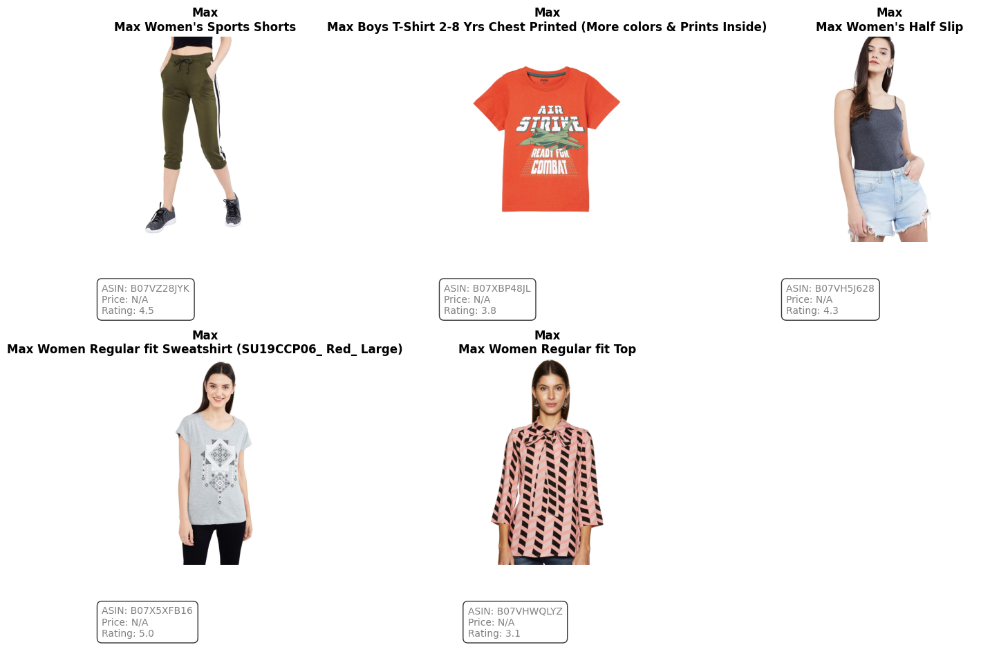

In [ ]:
import pandas as pd
import requests
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from PIL import Image
from io import BytesIO
from gensim.models import Word2Vec
import numpy as np

# File path to your LDJSON file
file_path = 'fashion_products_data.ldjson'

# Step 1: Load the LDJSON file into a Pandas DataFrame
data = pd.read_json(file_path, lines=True)

# Update these to match your dataset columns
brand_column = 'brand'                 # Column with brand names
asin_column = 'asin'                   # Column with ASINs
product_name_column = 'product_name'   # Column with product names
image_url_column = 'large'             # Column with product image URLs

# Ensure all required columns exist
required_columns = [brand_column, asin_column, product_name_column, image_url_column]
for col in required_columns:
    if col not in data.columns:
        raise ValueError(f"Field '{col}' not found in the dataset!")

# Step 2: Preprocess data for Word2Vec
data['product_name_tokens'] = data[product_name_column].str.split().dropna()  # Tokenize product names
tokenized_names = data['product_name_tokens'].tolist()

# Step 3: Train a Word2Vec model
word2vec_model = Word2Vec(sentences=tokenized_names, vector_size=100, window=5, min_count=2, workers=4)

# Step 4: Calculate Word2Vec vector for each product
def calculate_vector(tokens):
    vectors = [word2vec_model.wv[word] for word in tokens if word in word2vec_model.wv]
    return np.mean(vectors, axis=0) if vectors else np.zeros(word2vec_model.vector_size)

data['product_vector'] = data['product_name_tokens'].apply(calculate_vector)

# Step 5: Define similarity scores for ASIN recommendations
def cosine_similarity(vec1, vec2):
    if vec1 is not None and vec2 is not None and np.linalg.norm(vec1) > 0 and np.linalg.norm(vec2) > 0:
        return np.dot(vec1, vec2) / (np.linalg.norm(vec1) * np.linalg.norm(vec2))
    return 0

# Precompute the mean vector for the dataset
mean_vector = np.mean(data['product_vector'].tolist(), axis=0)

# Use vectorized computation for similarity
data['similarity'] = data['product_vector'].apply(lambda vec: cosine_similarity(vec, mean_vector))

# Step 6: Calculate brand weight and priority
brand_stats = data.groupby(brand_column).agg(
    avg_similarity=('similarity', 'mean'),
    product_count=(asin_column, 'count')
).reset_index()
brand_stats['brand_priority'] = brand_stats['avg_similarity'] * brand_stats['product_count']
brand_stats = brand_stats.sort_values(by='brand_priority', ascending=False)

# Step 7: Extract the top recommended brand
top_brand = brand_stats.iloc[0][brand_column]  # Get the highest-priority brand
print(f"Top Recommended Brand: {top_brand}")

# Filter products belonging to the top brand
top_brand_products = data[data[brand_column] == top_brand].sort_values(by='similarity', ascending=False)

# Output the ASINs of products from the top brand
recommended_asins = top_brand_products[asin_column].tolist()
print(f"Recommended ASINs for {top_brand}: {recommended_asins}")
# Enhanced visualization function
def display_professional_recommendations(products, limit=5):
    """
    Displays a professional visualization of recommended products, showing images and detailed information.
    """
    # Set up a grid for the product images (e.g., 2 rows, 3 columns)
    grid_size = (2, 3)  # Adjust this based on the limit and desired layout
    fig = plt.figure(figsize=(15, 10))
    gs = gridspec.GridSpec(*grid_size, figure=fig)

    for i, (_, row) in enumerate(products.iterrows()):
        if i >= limit:  # Stop after reaching the specified limit
            break

        # Get product details
        url = row[image_url_column]
        product_name = row[product_name_column]
        asin = row[asin_column]
        brand = row[brand_column]
        price = row.get('price', 'N/A')  # Assuming price data is available
        rating = row.get('rating', 'N/A')  # Assuming rating data is available

        # Try to load the product image
        try:
            response = requests.get(url)
            response.raise_for_status()
            img = Image.open(BytesIO(response.content))

            # Set up the subplot
            ax = fig.add_subplot(gs[i])
            ax.imshow(img)
            ax.axis('off')

            # Title and additional info
            ax.set_title(f"{brand}\n{product_name}", fontsize=12, fontweight='bold')

            # Adding product details below the image (Price, ASIN, etc.)
            details = f"ASIN: {asin}\nPrice: {price}\nRating: {rating}"
            ax.text(0, -0.2, details, ha='left', va='top', transform=ax.transAxes,
                    fontsize=10, color='gray', bbox=dict(facecolor='white', alpha=0.8, boxstyle='round,pad=0.5'))

        except Exception as e:
            print(f"Could not load image from URL: {url}. Error: {e}")
            continue

    # Add a title for the entire grid

    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make space for the suptitle
    plt.show()

# Display the top 5 products from the recommended brand
display_professional_recommendations(top_brand_products, limit=5)



In [ ]:
import tensorflow as tf
print(tf.config.list_physical_devices('GPU'))  # Check if GPU is available


[]


In [ ]:
import pandas as pd
import requests
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from PIL import Image
from io import BytesIO
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from sklearn.metrics.pairwise import cosine_similarity

# File path to your LDJSON file
file_path = 'fashion_products_data.ldjson'

# Step 1: Load the LDJSON file into a Pandas DataFrame
data = pd.read_json(file_path, lines=True)

# Update these to match your dataset columns
asin_column = 'asin'                   # Column with ASINs
product_name_column = 'product_name'   # Column with product names
image_url_column = 'large'             # Column with product image URLs

# Ensure all required columns exist
required_columns = [asin_column, product_name_column, image_url_column]
for col in required_columns:
    if col not in data.columns:
        raise ValueError(f"Field '{col}' not found in the dataset!")

# Step 2: Load pre-trained MobileNetV2 model (excluding the top classification layer)
mobilenet_model = MobileNetV2(weights='imagenet', include_top=False, pooling='avg', input_shape=(224, 224, 3))

# Step 3: Define the function to preprocess and extract features
def extract_image_features(img_url):
    try:
        response = requests.get(img_url)
        response.raise_for_status()
        img = Image.open(BytesIO(response.content)).convert('RGB')
        img = img.resize((224, 224))  # Resize to MobileNetV2 input size
        img_array = np.array(img)
        img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
        img_array = preprocess_input(img_array)  # Preprocess for MobileNetV2
        features = mobilenet_model.predict(img_array)
        return features.flatten()  # Flatten to 1D vector
    except Exception as e:
        print(f"Error loading or processing image: {e}")
        return None

# Step 4: Extract image features for all products
data['image_features'] = data[image_url_column].apply(extract_image_features)


# Step 5: Extract features for all the products
valid_data = data.dropna(subset=['image_features'])
image_features = np.vstack(valid_data['image_features'].to_numpy())  # Stack all features

# Step 6: Function to recommend similar products based on an input image
def recommend_similar_products_from_input(input_img_url, top_n=5):
    input_image_features = extract_image_features(input_img_url)
    if input_image_features is None:
        print("Error: Could not extract features from the input image.")
        return None

    # Compute similarity between input image and all products in the dataset
    input_similarity_scores = cosine_similarity([input_image_features], image_features).flatten()

    # Get the top N most similar products (excluding itself)
    similar_idx = input_similarity_scores.argsort()[-top_n-1:-1][::-1]  # Exclude itself
    return valid_data.iloc[similar_idx]

# Step 7: Allow the user to input an image URL for recommendations
input_image_url = 'https://path_to_your_image.jpg'  # Replace with the URL of the image you want to use
recommended_products = recommend_similar_products_from_input(input_image_url, top_n=5)

# Step 8: Visualize the recommended products
def display_professional_recommendations(products, limit=5):
    """
    Displays a professional visualization of recommended products, showing images and detailed information.
    """
    # Set up a grid for the product images (e.g., 2 rows, 3 columns)
    grid_size = (2, 3)  # Adjust this based on the limit and desired layout
    fig = plt.figure(figsize=(15, 10))
    gs = gridspec.GridSpec(*grid_size, figure=fig)

    for i, (_, row) in enumerate(products.iterrows()):
        if i >= limit:  # Stop after reaching the specified limit
            break

        # Get product details
        url = row[image_url_column]
        product_name = row[product_name_column]
        asin = row[asin_column]
        price = row.get('price', 'N/A')  # Assuming price data is available
        rating = row.get('rating', 'N/A')  # Assuming rating data is available

        # Try to load the product image
        try:
            response = requests.get(url)
            response.raise_for_status()
            img = Image.open(BytesIO(response.content))

            # Set up the subplot
            ax = fig.add_subplot(gs[i])
            ax.imshow(img)
            ax.axis('off')

            # Title and additional info
            ax.set_title(f"{product_name}", fontsize=12, fontweight='bold')

            # Adding product details below the image (Price, ASIN, etc.)
            details = f"ASIN: {asin}\nPrice: {price}\nRating: {rating}"
            ax.text(0, -0.2, details, ha='left', va='top', transform=ax.transAxes,
                    fontsize=10, color='gray', bbox=dict(facecolor='white', alpha=0.8, boxstyle='round,pad=0.5'))

        except Exception as e:
            print(f"Could not load image from URL: {url}. Error: {e}")
            continue

    # Add a title for the entire grid
    plt.suptitle(f"Top {limit} Recommended Products", fontsize=16, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make space for the suptitle
    plt.show()

# Display the top 5 recommended products based on image similarity
if recommended_products is not None:
    display_professional_recommendations(recommended_products, limit=5)


KeyboardInterrupt: 

In [ ]:
import pandas as pd
import requests
import numpy as np
from PIL import Image
from io import BytesIO
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split

# File path to your LDJSON file
file_path = 'fashion_products_data.ldjson'

# Step 1: Load the LDJSON file into a Pandas DataFrame
data = pd.read_json(file_path, lines=True)

# Update these to match your dataset columns
image_url_column = 'large'  # Update if your column name for image URLs is different

# Ensure the image URL column exists
if image_url_column not in data.columns:
    raise ValueError(f"Field '{image_url_column}' not found in the dataset!")

# Step 2: Load pre-trained MobileNetV2
base_model = MobileNetV2(weights="imagenet", include_top=False, pooling="avg", input_shape=(224, 224, 3))
feature_extractor = Model(inputs=base_model.input, outputs=base_model.output)

# Step 3: Function to load and preprocess an image
def preprocess_image(img_url):
    try:
        # Fetch image from the URL
        response = requests.get(img_url)
        response.raise_for_status()
        img = Image.open(BytesIO(response.content)).convert('RGB')

        # Resize image to MobileNetV2 input size
        img = img.resize((224, 224))

        # Convert to array and preprocess for MobileNetV2
        img_array = img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
        img_array = preprocess_input(img_array)
        return img_array
    except Exception as e:
        print(f"Error loading or processing image: {e}")
        return None

# Step 4: Extract features for all images
def extract_features(dataset):
    features = []
    for i, url in enumerate(dataset[image_url_column]):
        print(f"Processing image {i + 1}/{len(dataset)}: {url}")
        img = preprocess_image(url)
        if img is not None:
            feature = feature_extractor.predict(img)
            features.append(feature.flatten())
        else:
            features.append(None)
    return features

# Step 5: Train/Test split and feature extraction
train_data, test_data = train_test_split(data, test_size=0.2, random_state=42)
train_data["image_features"] = extract_features(train_data)
test_data["image_features"] = extract_features(test_data)

# Step 6: Save extracted features
train_data.to_pickle("train_image_features.pkl")
test_data.to_pickle("test_image_features.pkl")

print("Feature extraction complete! Data saved for later use.")


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Processing image 1/24000: https://images-na.ssl-images-amazon.com/images/I/61UlAgzX1jL._UL1440_.jpg|https://images-na.ssl-images-amazon.com/images/I/71W3H5RzNCL._UL1440_.jpg|https://images-na.ssl-images-amazon.com/images/I/71EmS55JhfL._UL1440_.jpg|https://images-na.ssl-images-amazon.com/images/I/61zsT0eciPL._UL1440_.jpg|https://images-na.ssl-images-amazon.com/images/I/514Ru2CY9oL._UL1115_.jpg|https://images-na.ssl-images-amazon.com/images/I/514Ru2CY9oL._UL1115_.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Processing image 2/24000: https://images-na.ssl-images-amazon.com/images/I/71xCqzRFYdL._UL1500_.jpg|https://images-na.ssl-images-amazon.com/images/I/61TcC2clZEL._UL1108_.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Processing image 3/24000: https://images-na.ssl-images-amazon.com/images/I/61TkX3D6CbL._UL1010_.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
Processing image 4/24000: https://images-na.ssl-images-amazon.com/images/I/81Bjg2ERhTL._UL1500_

KeyboardInterrupt: 

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step
9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 706ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 692ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 672ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 698ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 700ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 678ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 661ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 666ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 666ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━

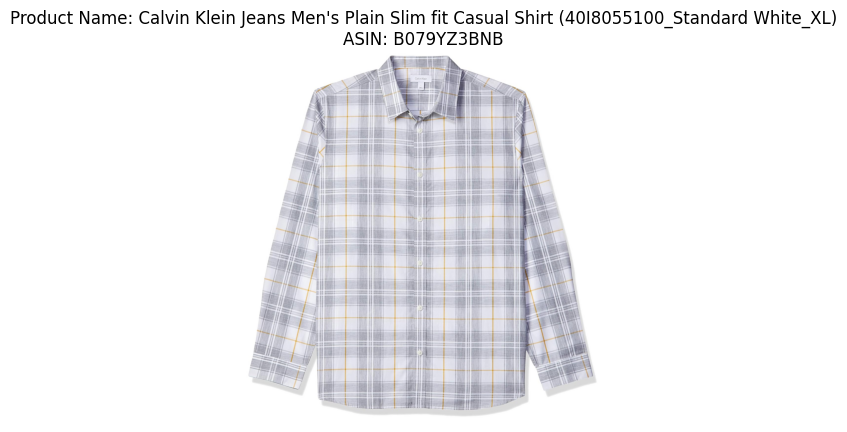

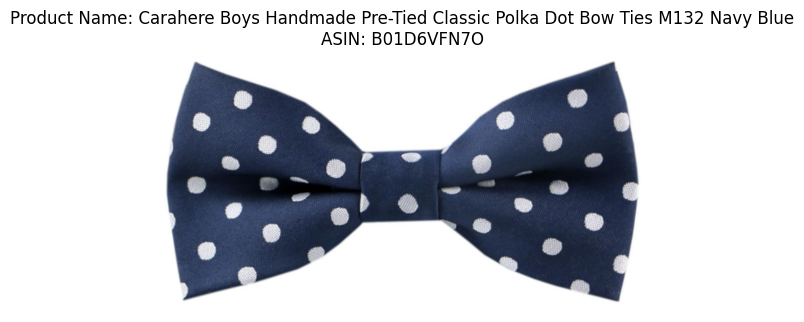

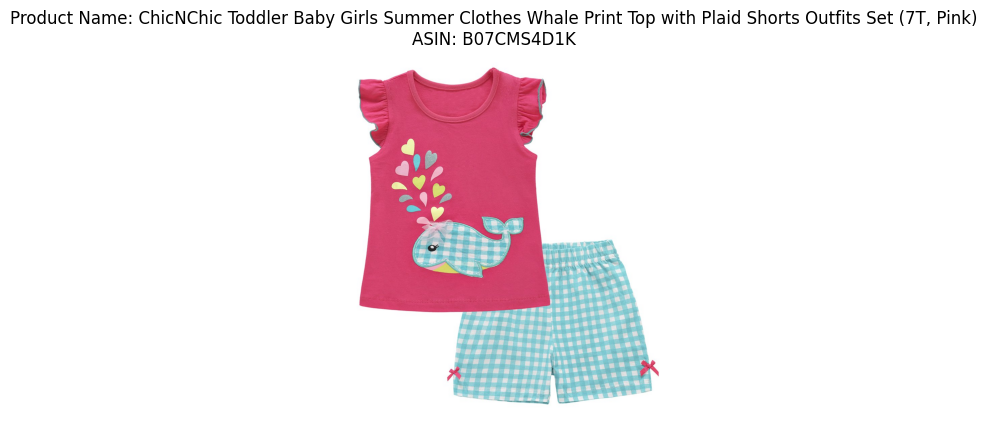

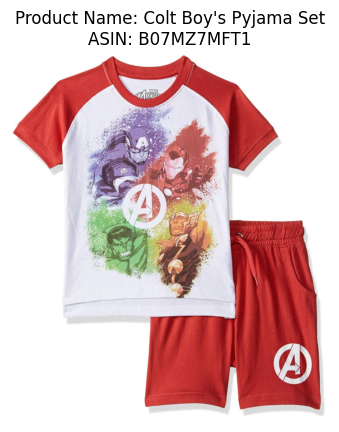

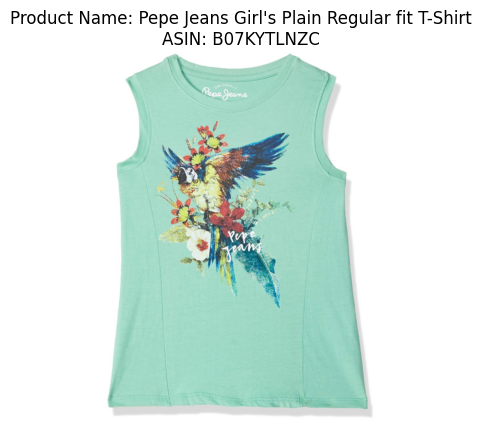

In [ ]:
import pandas as pd
import numpy as np
import requests
from PIL import Image
from io import BytesIO
from sklearn.metrics.pairwise import cosine_similarity
from tensorflow.keras.applications import VGG19, MobileNetV2
from tensorflow.keras.layers import GlobalAveragePooling2D
from gensim.models import Word2Vec
import matplotlib.pyplot as plt

# File path to your LDJSON file
file_path = 'fashion_products_data.ldjson'

# Load the LDJSON file into a Pandas DataFrame
data = pd.read_json(file_path, lines=True)

# Update column names for your dataset
image_url_column = 'large'  # Column with image URLs
product_name_column = 'product_name'  # Column with product names
asin_column = 'asin'  # Column with ASINs

# Ensure required columns exist
required_columns = [image_url_column, product_name_column, asin_column]
for col in required_columns:
    if col not in data.columns:
        raise ValueError(f"Field '{col}' not found in the dataset!")

# Step 1: Sample the dataset
sample_data = data[[image_url_column, product_name_column, asin_column]].dropna().head(50)

# Step 2: Define helper functions for image processing
def preprocess_image(img_url, target_size=(224, 224)):
    """Load and preprocess an image."""
    try:
        response = requests.get(img_url)
        response.raise_for_status()
        img = Image.open(BytesIO(response.content)).convert('RGB')
        img = img.resize(target_size)
        img_array = np.array(img) / 255.0  # Normalize pixel values
        img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
        return img_array
    except Exception as e:
        print(f"Error loading image from URL: {img_url}. Error: {e}")
        return None

# Step 3: Load VGG19 and MobileNetV2 models
vgg19 = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
mobilenet = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze layers
for model in [vgg19, mobilenet]:
    for layer in model.layers:
        layer.trainable = False

# Add pooling layers to extract global features
vgg19_output = GlobalAveragePooling2D()(vgg19.output)
mobilenet_output = GlobalAveragePooling2D()(mobilenet.output)

# Step 4: Extract Image Features
image_features = []
for i, row in sample_data.iterrows():
    img_array = preprocess_image(row[image_url_column])
    if img_array is not None:
        # Extract features using VGG19 and MobileNetV2
        vgg19_feat = vgg19.predict(img_array)
        mobilenet_feat = mobilenet.predict(img_array)
        # Combine features from both models
        combined_feat = np.concatenate((vgg19_feat.flatten(), mobilenet_feat.flatten()))
        image_features.append(combined_feat)
    else:
        image_features.append(np.zeros((2048,)))  # Placeholder for missing features

image_features = np.array(image_features)

# Step 5: Train Word2Vec on Product Names
product_names = [name.split() for name in sample_data[product_name_column]]
word2vec_model = Word2Vec(sentences=product_names, vector_size=100, window=5, min_count=1, workers=4)

# Generate text embeddings
text_features = []
for name in sample_data[product_name_column]:
    words = name.split()
    text_embedding = np.mean([word2vec_model.wv[word] for word in words if word in word2vec_model.wv] or [np.zeros(100)], axis=0)
    text_features.append(text_embedding)

text_features = np.array(text_features)

# Step 6: Combine Image and Text Features
combined_features = np.hstack((image_features, text_features))

# Step 7: Generate Recommendations
def recommend_items(item_index, combined_features, sample_data, top_n=5):
    """Generate top-N recommendations based on similarity."""
    similarities = cosine_similarity([combined_features[item_index]], combined_features)[0]
    similar_indices = np.argsort(similarities)[::-1][1:top_n + 1]  # Exclude the input item
    recommendations = sample_data.iloc[similar_indices]
    return recommendations

# Example Recommendation
item_index = 0  # Index of the item for which recommendations are to be generated
recommendations = recommend_items(item_index, combined_features, sample_data)

# Step 8: Display Recommendations
print(f"Recommendations for: {sample_data.iloc[item_index][product_name_column]}")
for i, row in recommendations.iterrows():
    url = row[image_url_column]
    product_name = row[product_name_column]
    asin = row[asin_column]
    try:
        response = requests.get(url)
        response.raise_for_status()
        img = Image.open(BytesIO(response.content))
        plt.figure()
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Product Name: {product_name}\nASIN: {asin}")
        plt.show()
    except Exception as e:
        print(f"Could not load image from URL: {url}. Error: {e}")


In [ ]:
import pandas as pd
import numpy as np
from tensorflow.keras.applications import VGG19, MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Flatten, Concatenate, GlobalAveragePooling2D, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from PIL import Image
import os
import requests
from io import BytesIO

# File path to your LDJSON file
file_path = 'fashion_products_data.ldjson'

# Step 1: Load and preprocess the dataset
data = pd.read_json(file_path, lines=True)

# Define required column names
image_url_column = 'large'  # Column with image URLs
label_column = 'product_name'  # Target labels (e.g., product names)

# Ensure required columns exist
required_columns = [image_url_column, label_column]
for col in required_columns:
    if col not in data.columns:
        raise ValueError(f"Field '{col}' not found in the dataset!")

# Drop rows with missing data and limit to 50 samples for simplicity
data = data[[image_url_column, label_column]].dropna().head(50)

# Step 2: Load images from URLs and preprocess them
def preprocess_image(img_url, target_size=(224, 224)):
    """Load and preprocess an image from URL."""
    try:
        response = requests.get(img_url)
        response.raise_for_status()
        img = Image.open(BytesIO(response.content)).convert('RGB')
        img = img.resize(target_size)
        img_array = np.array(img) / 255.0  # Normalize pixel values
        return img_array
    except Exception as e:
        print(f"Error loading image from URL: {img_url}. Error: {e}")
        return None

# Process images and filter out any failed downloads
images, labels = [], []
for _, row in data.iterrows():
    img = preprocess_image(row[image_url_column])
    if img is not None:
        images.append(img)
        labels.append(row[label_column])

# Convert images and labels to NumPy arrays
images = np.array(images)
labels = np.array(labels)

# Step 3: Encode labels
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
labels_encoded = label_encoder.fit_transform(labels)

# Step 4: Split the dataset into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(images, labels_encoded, test_size=0.2, random_state=42)

# Step 5: Build the hybrid model
def build_hybrid_model(input_shape):
    # Load pre-trained VGG19 and MobileNetV2
    vgg19 = VGG19(weights='imagenet', include_top=False, input_shape=input_shape)
    mobilenet = MobileNetV2(weights='imagenet', include_top=False, input_shape=input_shape)

    # Freeze layers of pre-trained models
    for layer in vgg19.layers:
        layer.trainable = False
    for layer in mobilenet.layers:
        layer.trainable = False

    # Add pooling layers to extract features
    vgg19_output = GlobalAveragePooling2D()(vgg19.output)
    mobilenet_output = GlobalAveragePooling2D()(mobilenet.output)

    # Concatenate features from both models
    combined_features = Concatenate()([vgg19_output, mobilenet_output])

    # Add dense layers for classification
    dense1 = Dense(256, activation='relu')(combined_features)
    dropout = Dropout(0.5)(dense1)
    output = Dense(len(np.unique(y_train)), activation='softmax')(dropout)

    # Create and compile the model
    hybrid_model = Model(inputs=[vgg19.input, mobilenet.input], outputs=output)
    hybrid_model.compile(optimizer=Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return hybrid_model

input_shape = (224, 224, 3)
hybrid_model = build_hybrid_model(input_shape)

# Step 6: Train the hybrid model
batch_size = 8
epochs = 10

# Data augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True
)

train_generator = datagen.flow(X_train, y_train, batch_size=batch_size)
val_generator = datagen.flow(X_val, y_val, batch_size=batch_size)

# Train the model
history = hybrid_model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=epochs,
    steps_per_epoch=len(X_train) // batch_size,
    validation_steps=len(X_val) // batch_size
)

# Step 7: Save the hybrid model
model_save_path = 'hybrid_model.h5'
hybrid_model.save(model_save_path)
print(f"Model saved to {model_save_path}")

# Step 8: Make recommendations (optional)
def recommend_item(item_index, X_data, model, top_n=3):
    """Generate top-N recommendations based on model predictions."""
    item_features = model.predict(np.expand_dims(X_data[item_index], axis=0))
    similarities = np.dot(X_data, item_features.T).flatten()
    similar_indices = np.argsort(similarities)[::-1][:top_n]
    return similar_indices

# Example: Generate recommendations
item_index = 0
recommended_indices = recommend_item(item_index, X_val, hybrid_model)
print(f"Recommendations for item index {item_index}: {recommended_indices}")


Epoch 1/10


ValueError: Layer "functional" expects 2 input(s), but it received 1 input tensors. Inputs received: [<tf.Tensor 'data:0' shape=(None, 224, 224, 3) dtype=float32>]

2/2 ━━━━━━━━━━━━━━━━━━━━ 41s 15s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 636ms/step


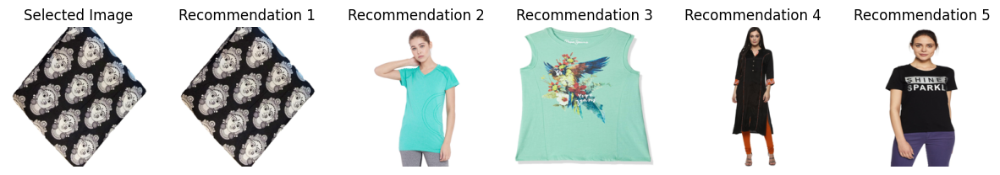

Recommendation 1: LA' Facon Cotton Kalamkari Handblock Saree Blouse Fabric 100 cms Black Base Dancers (Cotton)
Recommendation 2: C9 Women Turquoise Active T-Shirt
Recommendation 3: Pepe Jeans Girl's Plain Regular fit T-Shirt
Recommendation 4: Rangeelo rajasthan Women's Straight Kurta
Recommendation 5: Pepe Jeans Women's Solid T-Shirt


In [ ]:
import pandas as pd
import numpy as np
from tensorflow.keras.applications import VGG19, MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D, Concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder
from PIL import Image
from io import BytesIO
import requests
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt

# File path to your LDJSON file
file_path = 'fashion_products_data.ldjson'

# Step 1: Load and preprocess dataset
data = pd.read_json(file_path, lines=True)

# Update column names
image_url_column = 'large'
product_name_column = 'product_name'
asin_column = 'asin'

# Ensure required columns exist
required_columns = [image_url_column, product_name_column, asin_column]
for col in required_columns:
    if col not in data.columns:
        raise ValueError(f"Field '{col}' not found in the dataset!")

# Sample data (limit to 50 images)
sample_data = data[[image_url_column, product_name_column, asin_column]].dropna().head(50)

# Step 2: Preprocess images
def preprocess_image(img_url, target_size=(224, 224)):
    """Load and preprocess an image from URL."""
    try:
        response = requests.get(img_url)
        response.raise_for_status()
        img = Image.open(BytesIO(response.content)).convert('RGB')
        img = img.resize(target_size)
        img_array = np.array(img) / 255.0
        return img_array
    except Exception as e:
        print(f"Error loading image from URL: {img_url}. Error: {e}")
        return None

# Step 3: Build hybrid model
def build_hybrid_model(input_shape, num_classes):
    # Load pre-trained VGG19 and MobileNetV2
    vgg19 = VGG19(weights='imagenet', include_top=False, input_shape=input_shape)
    mobilenet = MobileNetV2(weights='imagenet', include_top=False, input_shape=input_shape)

    # Freeze layers
    for layer in vgg19.layers:
        layer.trainable = False
    for layer in mobilenet.layers:
        layer.trainable = False

    # Add pooling layers
    vgg19_output = GlobalAveragePooling2D()(vgg19.output)
    mobilenet_output = GlobalAveragePooling2D()(mobilenet.output)

    # Concatenate outputs
    merged = Concatenate()([vgg19_output, mobilenet_output])

    # Add dense layers
    dense = Dense(256, activation='relu')(merged)
    dropout = Dropout(0.5)(dense)
    output = Dense(num_classes, activation='softmax')(dropout)

    # Create model
    hybrid_model = Model(inputs=[vgg19.input, mobilenet.input], outputs=output)
    hybrid_model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])
    return hybrid_model

# Function to extract features (using the hybrid model)
def extract_features(model, images):
    features = model.predict([images, images])  # Provide two identical inputs
    return features

# Function to recommend top N similar images
def recommend_similar_images(model, image, images, top_n=5):
    # Extract features of all images
    features = extract_features(model, images)

    # Extract feature of the input image
    input_feature = model.predict([np.expand_dims(image, axis=0), np.expand_dims(image, axis=0)])  # Provide two identical inputs

    # Calculate cosine similarity between input image and all other images
    similarity_scores = cosine_similarity(input_feature, features)

    # Sort and get top N similar images
    similar_indices = similarity_scores[0].argsort()[-top_n:][::-1]

    return similar_indices, similarity_scores[0][similar_indices]

# Visualize the top N recommended images
def plot_recommended_images(recommended_products, images, indices):
    fig, axes = plt.subplots(1, len(indices) + 1, figsize=(15, 5))

    # Display the selected image
    axes[0].imshow(images[0])  # selected image
    axes[0].set_title("Selected Image")
    axes[0].axis('off')

    # Display recommended images
    for i, idx in enumerate(indices):
        axes[i + 1].imshow(images[idx])  # recommended images
        axes[i + 1].set_title(f"Recommendation {i + 1}")
        axes[i + 1].axis('off')

    plt.show()

    # Show recommended product names
    for i, idx in enumerate(indices):
        print(f"Recommendation {i + 1}: {recommended_products.iloc[i][product_name_column]}")

# Load and preprocess images
images = []
for _, row in sample_data.iterrows():
    img = preprocess_image(row[image_url_column])
    if img is not None:
        images.append(img)

images = np.array(images)

# Build the hybrid model
input_shape = (224, 224, 3)
hybrid_model = build_hybrid_model(input_shape, num_classes=len(sample_data[product_name_column].unique()))

# Select a sample image and get recommendations
selected_image = images[0]  # Select the first image from the list
top_n = 5

indices, scores = recommend_similar_images(hybrid_model, selected_image, images, top_n)
recommended_products = sample_data.iloc[indices]

# Visualize the recommended images
plot_recommended_images(recommended_products, images, indices)


2/2 ━━━━━━━━━━━━━━━━━━━━ 40s 14s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 647ms/step


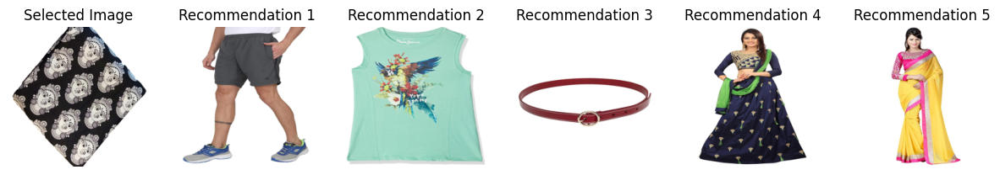

IndexError: single positional indexer is out-of-bounds

In [ ]:
import pandas as pd
import numpy as np
from tensorflow.keras.applications import VGG19, MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D, Concatenate
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import LabelEncoder
from PIL import Image
from io import BytesIO
import requests
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt

# File path to your LDJSON file
file_path = 'fashion_products_data.ldjson'

# Step 1: Load and preprocess dataset
data = pd.read_json(file_path, lines=True)

# Update column names
image_url_column = 'large'
product_name_column = 'product_name'
asin_column = 'asin'

# Ensure required columns exist
required_columns = [image_url_column, product_name_column, asin_column]
for col in required_columns:
    if col not in data.columns:
        raise ValueError(f"Field '{col}' not found in the dataset!")

# Sample data (limit to 50 images)
sample_data = data[[image_url_column, product_name_column, asin_column]].dropna().head(50)

# Step 2: Preprocess images
def preprocess_image(img_url, target_size=(224, 224)):
    """Load and preprocess an image from URL."""
    try:
        response = requests.get(img_url)
        response.raise_for_status()
        img = Image.open(BytesIO(response.content)).convert('RGB')
        img = img.resize(target_size)
        img_array = np.array(img) / 255.0
        return img_array
    except Exception as e:
        print(f"Error loading image from URL: {img_url}. Error: {e}")
        return None

# Step 3: Build hybrid model
def build_hybrid_model(input_shape, num_classes):
    # Load pre-trained VGG19 and MobileNetV2
    vgg19 = VGG19(weights='imagenet', include_top=False, input_shape=input_shape)
    mobilenet = MobileNetV2(weights='imagenet', include_top=False, input_shape=input_shape)

    # Freeze layers
    for layer in vgg19.layers:
        layer.trainable = False
    for layer in mobilenet.layers:
        layer.trainable = False

    # Add pooling layers
    vgg19_output = GlobalAveragePooling2D()(vgg19.output)
    mobilenet_output = GlobalAveragePooling2D()(mobilenet.output)

    # Concatenate outputs
    merged = Concatenate()([vgg19_output, mobilenet_output])

    # Add dense layers
    dense = Dense(256, activation='relu')(merged)
    dropout = Dropout(0.5)(dense)
    output = Dense(num_classes, activation='softmax')(dropout)

    # Create model
    hybrid_model = Model(inputs=[vgg19.input, mobilenet.input], outputs=output)
    hybrid_model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])
    return hybrid_model

# Function to extract features using the hybrid model
def extract_features(model, images):
    """Extract features for a batch of images using the hybrid model."""
    return model.predict([images, images])  # Two identical inputs for the hybrid model

# Function to recommend top N similar images
def recommend_similar_images(model, image, all_images, top_n=5):
    """
    Recommend similar images based on cosine similarity.

    Parameters:
    - model: Hybrid model for feature extraction.
    - image: Selected image for which recommendations are needed.
    - all_images: All preprocessed images.
    - top_n: Number of recommendations to return.

    Returns:
    - Indices and similarity scores of top N similar images.
    """
    # Extract features for all images
    features = extract_features(model, all_images)

    # Extract feature of the input image
    input_feature = model.predict([np.expand_dims(image, axis=0), np.expand_dims(image, axis=0)])

    # Calculate cosine similarity
    similarity_scores = cosine_similarity(input_feature, features)

    # Sort and get top N similar images
    similar_indices = similarity_scores[0].argsort()[-top_n - 1:][::-1]  # Exclude the selected image itself
    similar_indices = [idx for idx in similar_indices if not np.array_equal(all_images[idx], image)][:top_n]

    return similar_indices, similarity_scores[0][similar_indices]

# Visualize the top N recommended images
def plot_recommended_images(selected_image, recommended_indices, recommended_products, images):
    """
    Visualize the selected image and its recommendations.

    Parameters:
    - selected_image: The selected image.
    - recommended_indices: Indices of recommended images.
    - recommended_products: Dataframe containing product info for recommendations.
    - images: Array of preprocessed images.
    """
    fig, axes = plt.subplots(1, len(recommended_indices) + 1, figsize=(15, 5))

    # Display the selected image
    axes[0].imshow(selected_image)
    axes[0].set_title("Selected Image")
    axes[0].axis('off')

    # Display recommended images
    for i, idx in enumerate(recommended_indices):
        axes[i + 1].imshow(images[idx])
        axes[i + 1].set_title(f"Recommendation {i + 1}")
        axes[i + 1].axis('off')

    plt.show()

    # Show recommended product names
    for i, idx in enumerate(recommended_indices):
        print(f"Recommendation {i + 1}: {recommended_products.iloc[idx][product_name_column]}")

# Load and preprocess images
images = []
for _, row in sample_data.iterrows():
    img = preprocess_image(row[image_url_column])
    if img is not None:
        images.append(img)

images = np.array(images)

# Build the hybrid model
input_shape = (224, 224, 3)
hybrid_model = build_hybrid_model(input_shape, num_classes=len(sample_data[product_name_column].unique()))

# Select a sample image and get recommendations
selected_image = images[0]  # Select the first image from the list
top_n = 5

indices, scores = recommend_similar_images(hybrid_model, selected_image, images, top_n)
recommended_products = sample_data.iloc[indices]

# Visualize the recommended images
plot_recommended_images(selected_image, indices, recommended_products, images)


Error loading image from URL: https://images-na.ssl-images-amazon.com/images/I/81mtfbiO%2BTL._UL1500_.jpg|https://images-na.ssl-images-amazon.com/images/I/81bJQ1Ugq9L._UL1500_.jpg. Error: 404 Client Error: Not Found for url: https://images-na.ssl-images-amazon.com/images/I/81mtfbiO%2BTL._UL1500_.jpg%7Chttps://images-na.ssl-images-amazon.com/images/I/81bJQ1Ugq9L._UL1500_.jpg
Epoch 1/3
13/13 ━━━━━━━━━━━━━━━━━━━━ 77s 5s/step - accuracy: 0.0000e+00 - loss: 5.2479
Epoch 2/3
13/13 ━━━━━━━━━━━━━━━━━━━━ 81s 5s/step - accuracy: 0.0000e+00 - loss: 4.9552
Epoch 3/3
13/13 ━━━━━━━━━━━━━━━━━━━━ 70s 5s/step - accuracy: 0.0379 - loss: 4.5518
4/4 ━━━━━━━━━━━━━━━━━━━━ 80s 18s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step


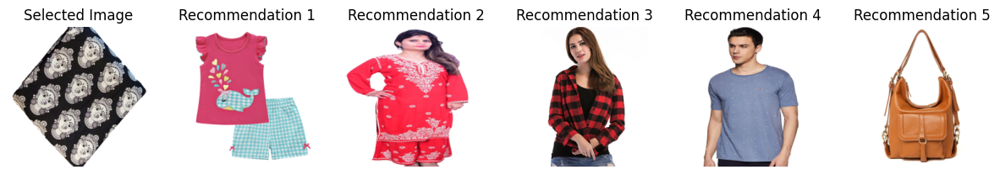

Recommendation 1: ChicNChic Toddler Baby Girls Summer Clothes Whale Print Top with Plaid Shorts Outfits Set (7T, Pink)
Recommendation 2: Women's Chicken Embellished/Embroidery Kurta -(Medium) Red
Recommendation 3: C.Cozami Women's Long Sleeves Casual White/Black/Red Checkered Shirt
Recommendation 4: Sf Jeans By Pantaloons Men's Plain Slim fit T-Shirt
Recommendation 5: SEALINF Womens Top Handle Leather Shoulder Bag Convertible Backpack with Front Flap (brown)


In [ ]:
import pandas as pd
import numpy as np
from tensorflow.keras.applications import VGG19, MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D, Concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics.pairwise import cosine_similarity
from PIL import Image
from io import BytesIO
import requests
import matplotlib.pyplot as plt

# File path to your LDJSON file
file_path = 'fashion_products_data.ldjson'

# Step 1: Load and preprocess dataset
data = pd.read_json(file_path, lines=True)

# Update column names
image_url_column = 'large'
product_name_column = 'product_name'
asin_column = 'asin'

# Ensure required columns exist
required_columns = [image_url_column, product_name_column, asin_column]
for col in required_columns:
    if col not in data.columns:
        raise ValueError(f"Field '{col}' not found in the dataset!")

# Sample data (limit to 100 images)
sample_data = data[[image_url_column, product_name_column, asin_column]].dropna().head(100)

# Step 2: Preprocess images
def preprocess_image(img_url, target_size=(224, 224)):
    """Load and preprocess an image from URL."""
    try:
        response = requests.get(img_url)
        response.raise_for_status()
        img = Image.open(BytesIO(response.content)).convert('RGB')
        img = img.resize(target_size)
        img_array = np.array(img) / 255.0
        return img_array
    except Exception as e:
        print(f"Error loading image from URL: {img_url}. Error: {e}")
        return None

# Load and preprocess all images
images = []
labels = []
for _, row in sample_data.iterrows():
    img = preprocess_image(row[image_url_column])
    if img is not None:
        images.append(img)
        labels.append(row[product_name_column])

images = np.array(images)

# Encode labels
label_encoder = LabelEncoder()
labels_encoded = label_encoder.fit_transform(labels)
labels_categorical = to_categorical(labels_encoded, num_classes=len(label_encoder.classes_))

# Step 3: Build hybrid model
def build_hybrid_model(input_shape, num_classes):
    # Load pre-trained VGG19 and MobileNetV2
    vgg19 = VGG19(weights='imagenet', include_top=False, input_shape=input_shape)
    mobilenet = MobileNetV2(weights='imagenet', include_top=False, input_shape=input_shape)

    # Freeze layers
    for layer in vgg19.layers:
        layer.trainable = False
    for layer in mobilenet.layers:
        layer.trainable = False

    # Add pooling layers
    vgg19_output = GlobalAveragePooling2D()(vgg19.output)
    mobilenet_output = GlobalAveragePooling2D()(mobilenet.output)

    # Concatenate outputs
    merged = Concatenate()([vgg19_output, mobilenet_output])

    # Add dense layers
    dense = Dense(256, activation='relu')(merged)
    dropout = Dropout(0.5)(dense)
    output = Dense(num_classes, activation='softmax')(dropout)

    # Create model
    hybrid_model = Model(inputs=[vgg19.input, mobilenet.input], outputs=output)
    hybrid_model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])
    return hybrid_model

# Step 4: Train the model on the dataset
input_shape = (224, 224, 3)
hybrid_model = build_hybrid_model(input_shape, num_classes=len(label_encoder.classes_))

# Train the model
history = hybrid_model.fit(
    [images, images],  # Pass the same image twice for the two model inputs
    labels_categorical,
    batch_size=8,
    epochs=3,
    verbose=1
)

# Step 5: Recommend similar images
def recommend_similar_images(model, image, all_images, top_n=5):
    """Recommend top N similar images based on cosine similarity."""
    # Extract features for all images
    feature_extractor = Model(inputs=model.input, outputs=model.layers[-3].output)
    features = feature_extractor.predict([all_images, all_images])

    # Extract feature of the input image
    input_feature = feature_extractor.predict([np.expand_dims(image, axis=0), np.expand_dims(image, axis=0)])

    # Calculate cosine similarity
    similarity_scores = cosine_similarity(input_feature, features)

    # Sort and get top N similar images
    similar_indices = similarity_scores[0].argsort()[-top_n - 1:][::-1]  # Exclude the selected image itself
    similar_indices = [idx for idx in similar_indices if not np.array_equal(all_images[idx], image)][:top_n]

    return similar_indices, similarity_scores[0][similar_indices]

# Step 6: Visualize selected and recommended images
def plot_recommended_images(selected_image, recommended_indices, sample_data, images):
    """Visualize the selected image and its recommendations."""
    fig, axes = plt.subplots(1, len(recommended_indices) + 1, figsize=(15, 5))

    # Display the selected image
    axes[0].imshow(selected_image)
    axes[0].set_title("Selected Image")
    axes[0].axis('off')

    # Display recommended images
    for i, idx in enumerate(recommended_indices):
        axes[i + 1].imshow(images[idx])
        axes[i + 1].set_title(f"Recommendation {i + 1}")
        axes[i + 1].axis('off')

    plt.show()

    # Show recommended product names
    for i, idx in enumerate(recommended_indices):
        product_info = sample_data.iloc[idx]
        print(f"Recommendation {i + 1}: {product_info[product_name_column]}")

# Select a sample image and get recommendations
selected_image = images[0]  # Select the first image from the list
top_n = 5

# Get indices and similarity scores
indices, scores = recommend_similar_images(hybrid_model, selected_image, images, top_n)

# Visualize the recommendations
plot_recommended_images(selected_image, indices, sample_data, images)


1/2 ━━━━━━━━━━━━━━━━━━━━ 28s 28s/step

2/2 ━━━━━━━━━━━━━━━━━━━━ 42s 14s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 643ms/step


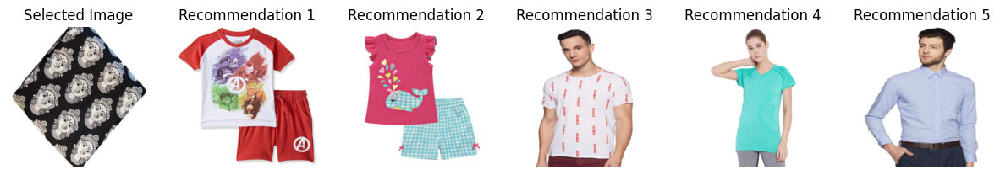

Recommendation 1: Colt Boy's Pyjama Set
Recommendation 2: ChicNChic Toddler Baby Girls Summer Clothes Whale Print Top with Plaid Shorts Outfits Set (7T, Pink)
Recommendation 3: Colt by Unlimited Men's T-Shirt
Recommendation 4: C9 Women Turquoise Active T-Shirt
Recommendation 5: Arrow Newyork Men's Checkered Slim Fit Formal Shirt


In [ ]:
import pandas as pd
import numpy as np
from tensorflow.keras.applications import VGG19, MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D, Concatenate
from tensorflow.keras.optimizers import Adam
from sklearn.metrics.pairwise import cosine_similarity
from PIL import Image
from io import BytesIO
import requests
import matplotlib.pyplot as plt

# File path to your LDJSON file
file_path = 'fashion_products_data.ldjson'

# Step 1: Load and preprocess dataset
data = pd.read_json(file_path, lines=True)

# Update column names
image_url_column = 'large'
product_name_column = 'product_name'
asin_column = 'asin'

# Ensure required columns exist
required_columns = [image_url_column, product_name_column, asin_column]
for col in required_columns:
    if col not in data.columns:
        raise ValueError(f"Field '{col}' not found in the dataset!")

# Sample data (limit to 50 images)
sample_data = data[[image_url_column, product_name_column, asin_column]].dropna().head(50)

# Step 2: Preprocess images
def preprocess_image(img_url, target_size=(224, 224)):
    """Load and preprocess an image from URL."""
    try:
        response = requests.get(img_url)
        response.raise_for_status()
        img = Image.open(BytesIO(response.content)).convert('RGB')
        img = img.resize(target_size)
        img_array = np.array(img) / 255.0
        return img_array
    except Exception as e:
        print(f"Error loading image from URL: {img_url}. Error: {e}")
        return None

# Step 3: Build hybrid model
def build_hybrid_model(input_shape, num_classes):
    # Load pre-trained VGG19 and MobileNetV2
    vgg19 = VGG19(weights='imagenet', include_top=False, input_shape=input_shape)
    mobilenet = MobileNetV2(weights='imagenet', include_top=False, input_shape=input_shape)

    # Freeze layers
    for layer in vgg19.layers:
        layer.trainable = False
    for layer in mobilenet.layers:
        layer.trainable = False

    # Add pooling layers
    vgg19_output = GlobalAveragePooling2D()(vgg19.output)
    mobilenet_output = GlobalAveragePooling2D()(mobilenet.output)

    # Concatenate outputs
    merged = Concatenate()([vgg19_output, mobilenet_output])

    # Add dense layers
    dense = Dense(256, activation='relu')(merged)
    dropout = Dropout(0.5)(dense)
    output = Dense(num_classes, activation='softmax')(dropout)

    # Create model
    hybrid_model = Model(inputs=[vgg19.input, mobilenet.input], outputs=output)
    hybrid_model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])
    return hybrid_model

# Function to extract features using the hybrid model
def extract_features(model, images):
    """Extract features for a batch of images using the hybrid model."""
    return model.predict([images, images])  # Two identical inputs for the hybrid model

# Function to recommend top N similar images
def recommend_similar_images(model, image, all_images, top_n=5):
    """
    Recommend similar images based on cosine similarity.

    Parameters:
    - model: Hybrid model for feature extraction.
    - image: Selected image for which recommendations are needed.
    - all_images: All preprocessed images.
    - top_n: Number of recommendations to return.

    Returns:
    - Indices and similarity scores of top N similar images.
    """
    # Extract features for all images
    features = extract_features(model, all_images)

    # Extract feature of the input image
    input_feature = model.predict([np.expand_dims(image, axis=0), np.expand_dims(image, axis=0)])

    # Calculate cosine similarity
    similarity_scores = cosine_similarity(input_feature, features)

    # Sort and get top N similar images
    similar_indices = similarity_scores[0].argsort()[-top_n - 1:][::-1]  # Exclude the selected image itself
    similar_indices = [idx for idx in similar_indices if not np.array_equal(all_images[idx], image)][:top_n]

    return similar_indices, similarity_scores[0][similar_indices]

# Function to visualize the selected and recommended images
def plot_recommended_images(selected_image, recommended_indices, sample_data, images):
    """
    Visualize the selected image and its recommendations.

    Parameters:
    - selected_image: The selected image.
    - recommended_indices: Indices of recommended images.
    - sample_data: DataFrame containing product info.
    - images: Array of preprocessed images.
    """
    fig, axes = plt.subplots(1, len(recommended_indices) + 1, figsize=(15, 5))

    # Display the selected image
    axes[0].imshow(selected_image)
    axes[0].set_title("Selected Image")
    axes[0].axis('off')

    # Display recommended images
    for i, idx in enumerate(recommended_indices):
        axes[i + 1].imshow(images[idx])
        axes[i + 1].set_title(f"Recommendation {i + 1}")
        axes[i + 1].axis('off')

    plt.show()

    # Show recommended product names
    for i, idx in enumerate(recommended_indices):
        product_info = sample_data.iloc[idx]
        print(f"Recommendation {i + 1}: {product_info[product_name_column]}")

# Load and preprocess images
images = []
for _, row in sample_data.iterrows():
    img = preprocess_image(row[image_url_column])
    if img is not None:
        images.append(img)

images = np.array(images)

# Build the hybrid model
input_shape = (224, 224, 3)
hybrid_model = build_hybrid_model(input_shape, num_classes=len(sample_data[product_name_column].unique()))

# Select a sample image and get recommendations
selected_image = images[0]  # Select the first image from the list
top_n = 5

# Get indices and similarity scores
indices, scores = recommend_similar_images(hybrid_model, selected_image, images, top_n)

# Visualize the recommendations
plot_recommended_images(selected_image, indices, sample_data, images)


Error loading image from URL: https://images-na.ssl-images-amazon.com/images/I/81mtfbiO%2BTL._UL1500_.jpg|https://images-na.ssl-images-amazon.com/images/I/81bJQ1Ugq9L._UL1500_.jpg. Error: 404 Client Error: Not Found for url: https://images-na.ssl-images-amazon.com/images/I/81mtfbiO%2BTL._UL1500_.jpg%7Chttps://images-na.ssl-images-amazon.com/images/I/81bJQ1Ugq9L._UL1500_.jpg
4/4 ━━━━━━━━━━━━━━━━━━━━ 76s 17s/step


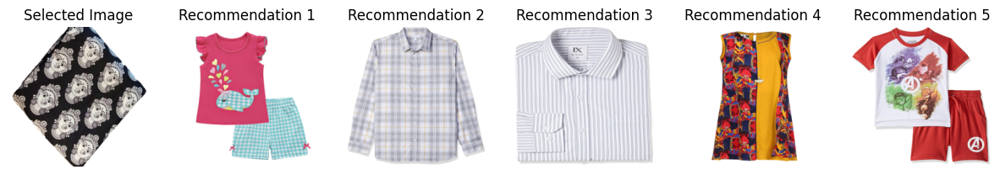

Recommendation 1: DHRUVI TRENDZ Women's Soft Cotton Plain Saree with Blouse Piece Material
Recommendation 2: ChicNChic Toddler Baby Girls Summer Clothes Whale Print Top with Plaid Shorts Outfits Set (7T, Pink)
Recommendation 3: Forever Men Braided Casual Pure Leather Belt with Imported pin Buckle with belts for Boy casual stylish width 38mm color Blue New collection leather belt for men formal branded,Free Size upto 44 inch
Recommendation 4: Linkin Park by Free Authority Men's Regular fit T-Shirt
Recommendation 5: Magson Neo Men's Assorted Tie (2018 collection)


In [ ]:
import pandas as pd
import numpy as np
from tensorflow.keras.applications import VGG19, MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D, Concatenate
from tensorflow.keras.optimizers import Adam
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import normalize
from PIL import Image
from io import BytesIO
import requests
import matplotlib.pyplot as plt

# File path to your LDJSON file
file_path = 'fashion_products_data.ldjson'

# Step 1: Load and preprocess dataset
data = pd.read_json(file_path, lines=True)

# Update column names
image_url_column = 'large'
product_name_column = 'product_name'
asin_column = 'asin'

# Ensure required columns exist
required_columns = [image_url_column, product_name_column, asin_column]
for col in required_columns:
    if col not in data.columns:
        raise ValueError(f"Field '{col}' not found in the dataset!")

# Sample data (limit to 100 images)
sample_data = data[[image_url_column, product_name_column, asin_column]].dropna().head(100)

# Step 2: Preprocess images
def preprocess_image(img_url, target_size=(224, 224)):
    """Load and preprocess an image from URL."""
    try:
        response = requests.get(img_url)
        response.raise_for_status()
        img = Image.open(BytesIO(response.content)).convert('RGB')
        img = img.resize(target_size)
        img_array = np.array(img) / 255.0
        return img_array
    except Exception as e:
        print(f"Error loading image from URL: {img_url}. Error: {e}")
        return None

# Load and preprocess all images
images = []
valid_indices = []
for idx, row in sample_data.iterrows():
    img = preprocess_image(row[image_url_column])
    if img is not None:
        images.append(img)
        valid_indices.append(idx)

images = np.array(images)

# Step 3: Build hybrid feature extractor
def build_feature_extractor(input_shape):
    # Load pre-trained VGG19 and MobileNetV2
    vgg19 = VGG19(weights='imagenet', include_top=False, input_shape=input_shape)
    mobilenet = MobileNetV2(weights='imagenet', include_top=False, input_shape=input_shape)

    # Freeze layers
    for layer in vgg19.layers:
        layer.trainable = False
    for layer in mobilenet.layers:
        layer.trainable = False

    # Add pooling layers
    vgg19_output = GlobalAveragePooling2D()(vgg19.output)
    mobilenet_output = GlobalAveragePooling2D()(mobilenet.output)

    # Concatenate outputs
    merged_features = Concatenate()([vgg19_output, mobilenet_output])

    # Create feature extraction model
    feature_extractor = Model(inputs=[vgg19.input, mobilenet.input], outputs=merged_features)
    return feature_extractor

# Step 4: Extract features
input_shape = (224, 224, 3)
feature_extractor = build_feature_extractor(input_shape)

# Extract features for all images
features = feature_extractor.predict([images, images])

# Normalize features for similarity calculation
normalized_features = normalize(features)

# Step 5: Recommend similar images
def recommend_similar_images(feature_vector, all_features, top_n=5):
    """Recommend top N similar images based on cosine similarity."""
    # Compute cosine similarity
    similarity_scores = cosine_similarity(feature_vector.reshape(1, -1), all_features)[0]

    # Sort by similarity
    similar_indices = similarity_scores.argsort()[-top_n - 1:][::-1]  # Exclude the input image itself
    return similar_indices[1:top_n + 1], similarity_scores[similar_indices[1:top_n + 1]]

# Step 6: Visualize selected and recommended images
def plot_recommended_images(selected_image, recommended_indices, sample_data, images):
    """Visualize the selected image and its recommendations."""
    fig, axes = plt.subplots(1, len(recommended_indices) + 1, figsize=(15, 5))

    # Display the selected image
    axes[0].imshow(selected_image)
    axes[0].set_title("Selected Image")
    axes[0].axis('off')

    # Display recommended images
    for i, idx in enumerate(recommended_indices):
        axes[i + 1].imshow(images[idx])
        axes[i + 1].set_title(f"Recommendation {i + 1}")
        axes[i + 1].axis('off')

    plt.show()

    # Show recommended product names
    for i, idx in enumerate(recommended_indices):
        product_info = sample_data.iloc[valid_indices[idx]]
        print(f"Recommendation {i + 1}: {product_info[product_name_column]}")

# Select a sample image and get recommendations
selected_index = 0  # Index of the selected image
selected_image = images[selected_index]
selected_feature = normalized_features[selected_index]

# Get recommendations
top_n = 5
recommended_indices, scores = recommend_similar_images(selected_feature, normalized_features, top_n)

# Visualize recommendations
plot_recommended_images(selected_image, recommended_indices, sample_data, images)
